In [12]:
# Corrected path construction
FINETUNED_CHECKPOINT_PATH = os.path.join(
    PROJECT_ROOT,
    "train_log/finetune_20250623-060425",  # Replace with your actual log directory
    "2025_06_23-06_06_12-model_ViT-B-32-lr_2e-05-b_1800-j_16-p_amp_bfloat16/checkpoints/epoch_30.pt"
)

NameError: name 'PROJECT_ROOT' is not defined

In [20]:
FINETUNED_CHECKPOINT_PATH

'/cwStorage/nodecw_group/jijh/training_log/cfff_train/openclip_train/train_log/finetune_20250623-060425/2025_06_23-06_06_12-model_ViT-B-32-lr_2e-05-b_1800-j_16-p_amp_bfloat16/checkpoints/epoch_30.pt'

2025-06-27 20:34:07 - [INFO] - Initializing ClipVisualizer...
2025-06-27 20:34:07 - [INFO] - Using device: CUDA:2
2025-06-27 20:34:07 - [INFO] - Loading Original Pre-trained model from: /cwStorage/nodecw_group/jijh/openclip_train/open_clip/CLIP-ViT-B-32/open_clip_model.safetensors
2025-06-27 20:34:07 - [INFO] - Parsing model identifier. Schema: None, Identifier: ViT-B-32
2025-06-27 20:34:07 - [INFO] - Loaded built-in ViT-B-32 model config.
2025-06-27 20:34:07 - [INFO] - No potential checkpoint path found from config source or pretrained arg.
2025-06-27 20:34:07 - [INFO] - Instantiating model architecture: CLIP
2025-06-27 20:34:08 - [WARNING] - Model ViT-B-32 initialized partially.
2025-06-27 20:34:08 - [INFO] - Final image preprocessing configuration set: {'size': (224, 224), 'mode': 'RGB', 'mean': (0.48145466, 0.4578275, 0.40821073), 'std': (0.26862954, 0.26130258, 0.27577711), 'interpolation': 'bicubic', 'resize_mode': 'shortest', 'fill_color': 0}
2025-06-27 20:34:08 - [INFO] - Model

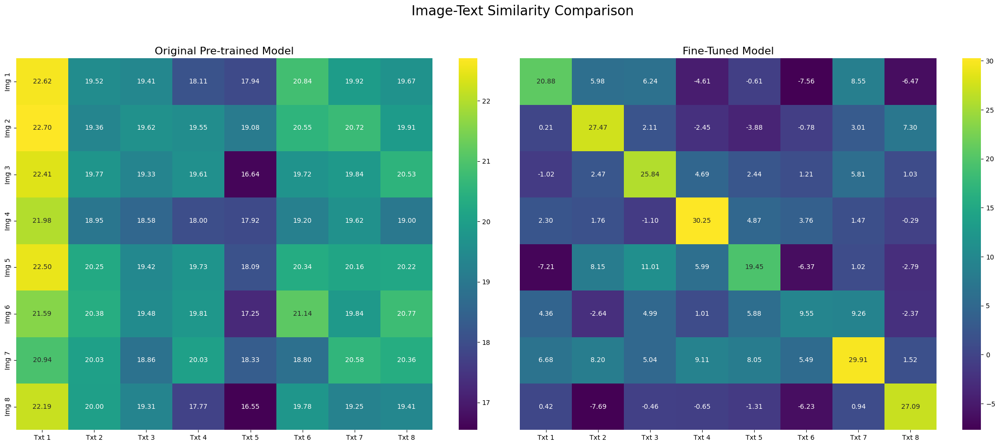

2025-06-27 20:34:15 - [INFO] - --- Heatmap Caption Reference ---
2025-06-27 20:34:15 - [INFO] - Img/Txt 1: LIPA-1 CD36 LPL-1 ITGB2-1 LGMN-1 MSR1-1 EEF1G ANXA2 ARRB2 SLCO2B1-1 CALM3 CD68 MAFB-1 FCGB...
2025-06-27 20:34:15 - [INFO] - Img/Txt 2: AQP3 S100A12-1 EHF CLCA2 MALL-1 FGFBP1 ACTG2 SERPINB2-1 KLK11-1 CXCL2 SERPINB9-1 LY6D-1 SO...
2025-06-27 20:34:15 - [INFO] - Img/Txt 3: ALB SERPINA1-1 APOC1 C3 APOE MT2A-1 RBP4-1 SERPING1-1 ALDOB MT1E-1 CALR CFB C1R NNMT-1 CLU...
2025-06-27 20:34:15 - [INFO] - Img/Txt 4: EGR1 SFRP4-1 MUC1-1 SERPINA3-1 LUM-1 KRT7-1 TACSTD2-1 MMP2-1 TPD52-1 STC2-1 GATA3 POSTN-1 ...
2025-06-27 20:34:15 - [INFO] - Img/Txt 5: SPON2-1 JUNB-1 MT2A-1 FOS PPDPF-1 DHRS7 SEC11C-1 SMS-1 PMEPA1-1 NR4A1-1 MIF-1 ANPEP FOXA1 ...
2025-06-27 20:34:15 - [INFO] - Img/Txt 6: FTH1 MT3-1 CST3 GLUL PTGDS-1 COX6C EIF1 SPARCL1-1 CALM1 CLU CALM2 CXCL14 YWHAZ-1 EEF1A2 UC...
2025-06-27 20:34:15 - [INFO] - Img/Txt 7: A2M ZYG11B-1 ZXDC-1 ZXDB-1 ZWINT-1 ZWILCH-1 ZSWIM7-1 ZSWIM6-1 ACBD5 ACAT2 ACA

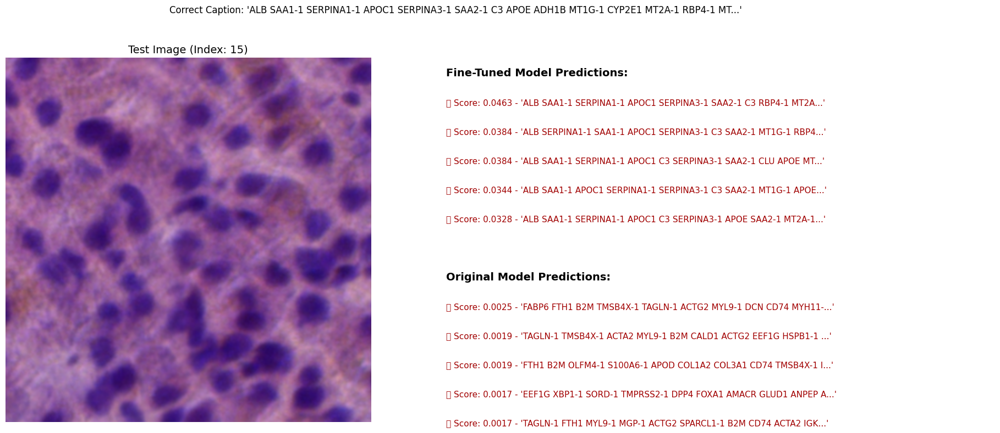

2025-06-27 20:34:56 - [INFO] - ====== Visualization Suite Finished ======


In [13]:
# ==============================================================================
# Full Modified Visualization Script
# ==============================================================================
import os
import sys
import logging
import numpy as np
import pandas as pd
import torch
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import open_clip
from collections import OrderedDict

# Attempt to import safetensors
try:
    from safetensors.torch import load_file as load_safetensors
except ImportError:
    print("Error: The 'safetensors' library is not installed. Please install it with 'pip install safetensors'")
    sys.exit(1)

# ==============================================================================
# 1. CONFIGURATION: EDIT THIS SECTION
# ==============================================================================
class VisualizationConfig:
    """A central place for all your paths and settings for the visualization."""
    # --- Paths ---
    PROJECT_ROOT = "/cwStorage/nodecw_group/jijh/training_log/cfff_train/openclip_train"

    # Path to the validation manifest CSV
    VAL_MANIFEST = os.path.join(PROJECT_ROOT, "validation_manifest.csv")

    # Path to the ORIGINAL pre-trained model you started with
    PRETRAINED_MODEL_PATH = "/cwStorage/nodecw_group/jijh/openclip_train/open_clip/CLIP-ViT-B-32/open_clip_model.safetensors"

    # Path to your FINAL, fine-tuned checkpoint.
    # IMPORTANT: Update this to point to the checkpoint you want to evaluate.
    FINETUNED_CHECKPOINT_PATH = os.path.join(PROJECT_ROOT,"train_log/finetune_20250623-060425",  # Replace with your actual log directory
        "2025_06_23-06_06_12-model_ViT-B-32-lr_2e-05-b_1800-j_16-p_amp_bfloat16/checkpoints/epoch_30.pt"
)

    # --- Model & Device ---
    MODEL_NAME = "ViT-B-32"
    DEVICE = "cuda:2" if torch.cuda.is_available() else "cpu"

    # --- Visualization Sample Sizes ---
    HEATMAP_SAMPLE_SIZE = 8
    QUALITATIVE_SAMPLE_IDX = 15

# ==============================================================================
# 2. VISUALIZATION CLASS: MODIFICATIONS APPLIED
# ==============================================================================
class ClipVisualizer:
    """
    A class to visualize and compare the performance of a fine-tuned OpenCLIP model
    against its original pre-trained version.
    """
    def __init__(self, config: VisualizationConfig):
        """
        Initializes the visualizer by setting up logging, loading models, and data.
        """
        self.config = config
        self._setup_logging()

        logging.info("Initializing ClipVisualizer...")
        logging.info(f"Using device: {self.config.DEVICE.upper()}")

        self.original_model, self.img_processor, self.tokenizer = self._load_model(
            "Original Pre-trained", self.config.PRETRAINED_MODEL_PATH
        )
        self.finetuned_model, _, _ = self._load_model(
            "Fine-tuned", self.config.FINETUNED_CHECKPOINT_PATH
        )
        self.df_val = self._load_validation_data()

    def _setup_logging(self):
        """Configures the logging format and level."""
        logging.basicConfig(
            level=logging.INFO,
            format="%(asctime)s - [%(levelname)s] - %(message)s",
            datefmt="%Y-%m-%d %H:%M:%S"
        )

    def _load_model(self, model_id: str, checkpoint_path: str):
        """
        Loads an OpenCLIP model and its preprocessors robustly from a local file.
        This version automatically handles checkpoints from DistributedDataParallel (DDP) training.
        """
        logging.info(f"Loading {model_id} model from: {checkpoint_path}")

        if not os.path.exists(checkpoint_path):
            logging.error(f"Checkpoint file not found at {checkpoint_path}")
            raise FileNotFoundError(f"Checkpoint file not found at {checkpoint_path}")

        model, _, image_processor = open_clip.create_model_and_transforms(
            self.config.MODEL_NAME,
            pretrained=None,
            device=self.config.DEVICE
        )
        tokenizer = open_clip.get_tokenizer(self.config.MODEL_NAME)

        if checkpoint_path.endswith(".safetensors"):
            state_dict = load_safetensors(checkpoint_path, device=self.config.DEVICE)
        else:
            state_dict = torch.load(checkpoint_path, map_location=self.config.DEVICE)

        if 'state_dict' in state_dict:
            state_dict = state_dict['state_dict']

        if all(key.startswith('module.') for key in state_dict.keys()):
            logging.info("Detected 'module.' prefix from DDP training, stripping it from state_dict keys.")
            stripped_state_dict = OrderedDict()
            for key, value in state_dict.items():
                new_key = key.replace('module.', '', 1)
                stripped_state_dict[new_key] = value
            state_dict = stripped_state_dict

        try:
            model.load_state_dict(state_dict, strict=True)
            logging.info(f"{model_id} model loaded successfully.")
        except RuntimeError as e:
            logging.error(f"Failed to load state dict for {model_id}. Key mismatch error: {e}")
            raise

        model.eval()
        return model, image_processor, tokenizer

    def _load_validation_data(self):
        logging.info(f"Loading validation data from: {self.config.VAL_MANIFEST}")
        df = pd.read_csv(self.config.VAL_MANIFEST)
        # replace old root with new root for *all* image_paths
        old_root = '/cpfs01/projects-HDD/cfff-afe2df89e32e_HDD/jjh_19301050235/my_data/hest_data/'
        new_root = '/cwStorage/nodecw_group/jijh/'
        df['image_path'] = df['image_path'].str.replace(old_root, new_root, regex=False)
        logging.info(f"Successfully loaded validation manifest with {len(df)} samples.")
        return df

    def _get_similarity_matrix(self, model, image_paths: list, captions: list) -> np.ndarray:
        """
        Encodes a batch of images and texts and computes their cosine similarity matrix.
        """
        logging.info(f"Encoding {len(image_paths)} image/text pairs...")
        images = [self.img_processor(Image.open(p).convert("RGB")) for p in image_paths]
        image_tensor = torch.stack(images).to(self.config.DEVICE)
        text_tokens = self.tokenizer(captions).to(self.config.DEVICE)

        with torch.no_grad(), torch.cuda.amp.autocast():
            image_features = model.encode_image(image_tensor)
            text_features = model.encode_text(text_tokens)

            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)

            logging.info(f"Encoded image features shape: {image_features.shape}")
            logging.info(f"Encoded text features shape: {text_features.shape}")

            logit_scale = model.logit_scale.exp()
            similarity = (logit_scale * image_features @ text_features.T)

        return similarity.cpu().numpy()

    def plot_similarity_heatmap(self, sample_size: int = 8, random_seed: int = 42):
        """
        Generates and displays side-by-side Image-Text similarity heatmaps.
        """
        logging.info(f"Generating similarity heatmaps using {sample_size} samples...")
        df_sample = self.df_val.sample(n=sample_size, random_state=random_seed)
        image_paths = df_sample['image_path'].tolist()
        captions = df_sample['gene_sentence'].tolist()

        original_sim = self._get_similarity_matrix(self.original_model, image_paths, captions)
        finetuned_sim = self._get_similarity_matrix(self.finetuned_model, image_paths, captions)

        fig, axes = plt.subplots(1, 2, figsize=(22, 10))
        fig.suptitle('Image-Text Similarity Comparison', fontsize=20)

        sns.heatmap(
            original_sim, annot=True, fmt=".2f", cmap='viridis', ax=axes[0],
            xticklabels=[f"Txt {i+1}" for i in range(sample_size)],
            yticklabels=[f"Img {i+1}" for i in range(sample_size)]
        )
        axes[0].set_title('Original Pre-trained Model', fontsize=16)

        sns.heatmap(
            finetuned_sim, annot=True, fmt=".2f", cmap='viridis', ax=axes[1],
            xticklabels=[f"Txt {i+1}" for i in range(sample_size)],
            yticklabels=[]
        )
        axes[1].set_title('Fine-Tuned Model', fontsize=16)

        plt.tight_layout(rect=[0, 0.05, 1, 0.95])
        plt.show()

        logging.info("--- Heatmap Caption Reference ---")
        for i, cap in enumerate(captions):
            logging.info(f"Img/Txt {i+1}: {cap[:90]}...")

    # [MODIFIED] This method now generates the plot with image and text
    def analyze_top_predictions(self, sample_idx: int):
        """
        Performs a qualitative analysis on a single image, showing the image
        and the top text predictions from both models in a single plot.
        """
        if sample_idx >= len(self.df_val):
            logging.error(f"sample_idx {sample_idx} is out of bounds for validation data of size {len(self.df_val)}.")
            return

        logging.info(f"Analyzing top predictions for sample index: {sample_idx}")
        test_sample = self.df_val.iloc[sample_idx]
        image_path = test_sample['image_path']
        correct_caption = test_sample['gene_sentence']
        

        # Use all other validation captions as distractors
        distractor_captions = self.df_val['gene_sentence'].tolist()
        if correct_caption not in distractor_captions:
             distractor_captions.append(correct_caption)


        # Get top 5 predictions for each model
        original_preds = self._get_top_k_predictions(
            "Original Model", self.original_model, image_path, correct_caption, distractor_captions, k=5
        )
        finetuned_preds = self._get_top_k_predictions(
            "Fine-Tuned Model", self.finetuned_model, image_path, correct_caption, distractor_captions, k=5
        )

        # --- Create the Visualization ---
        logging.info(f"Displaying test image and predictions: {os.path.basename(image_path)}")
        img = Image.open(image_path)
        
        fig, axes = plt.subplots(1, 2, figsize=(20, 8))
        
        # Display Image on the left subplot
        axes[0].imshow(img)
        axes[0].set_title(f"Test Image (Index: {sample_idx})", fontsize=14)
        axes[0].axis('off')

        # Display Text Predictions on the right subplot
        axes[1].axis('off')
        y_pos = 0.95
        line_height = 0.08

        # --- Plot Fine-Tuned Model Predictions ---
        axes[1].text(0, y_pos, 'Fine-Tuned Model Predictions:', fontsize=14, weight='bold')
        y_pos -= line_height
        for score, caption, is_correct in finetuned_preds:
            color = 'green' if is_correct else '#a10000' # Dark red
            marker = "✅" if is_correct else "❌"
            axes[1].text(0, y_pos, f"{marker} Score: {score:.4f} - '{caption[:60]}...'", color=color, fontsize=11)
            y_pos -= line_height

        # --- Plot Original Model Predictions ---
        y_pos -= line_height # Add extra space
        axes[1].text(0, y_pos, 'Original Model Predictions:', fontsize=14, weight='bold')
        y_pos -= line_height
        for score, caption, is_correct in original_preds:
            color = 'green' if is_correct else '#a10000'
            marker = "✅" if is_correct else "❌"
            axes[1].text(0, y_pos, f"{marker} Score: {score:.4f} - '{caption[:60]}...'", color=color, fontsize=11)
            y_pos -= line_height
            
        fig.suptitle(f"Correct Caption: '{correct_caption[:90]}...'", fontsize=12, y=0.98)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    # [MODIFIED] Renamed and changed to return predictions instead of just printing
    def _get_top_k_predictions(self, model_id, model, image_path, correct_caption, all_captions, k=5) -> list:
        """
        Helper to compute and return top k predictions for a given model.
        Returns a list of tuples: (score, caption, is_correct_flag)
        """
        logging.info(f"--- Getting Top {k} Predictions for: {model_id} ---")

        similarity = self._get_similarity_matrix(model, [image_path], all_captions)
        scores = torch.from_numpy(similarity).softmax(dim=-1).squeeze()

        top_k_scores, top_k_indices = torch.topk(scores, k=k)

        predictions = []
        for i in range(k):
            score = top_k_scores[i].item()
            idx = top_k_indices[i].item()
            predicted_caption = all_captions[idx]
            is_correct = (predicted_caption == correct_caption)
            
            # Still log to console for debugging
            log_marker = "✅ CORRECT" if is_correct else "❌"
            logging.info(f"  {i+1}. Score: {score:.4f} {log_marker} - '{predicted_caption[:90]}...'")
            
            predictions.append((score, predicted_caption, is_correct))
        
        return predictions


    def run_all_visualizations(self):
        """A convenience method to run a standard suite of visualizations."""
        logging.info("====== Starting Standard Visualization Suite ======")
        self.plot_similarity_heatmap(
            sample_size=self.config.HEATMAP_SAMPLE_SIZE
        )
        self.analyze_top_predictions(
            sample_idx=self.config.QUALITATIVE_SAMPLE_IDX
        )
        logging.info("====== Visualization Suite Finished ======")


# ==============================================================================
# 3. EXECUTION: RUN THE VISUALIZER
# ==============================================================================

try:
    config = VisualizationConfig()
    visualizer = ClipVisualizer(config)
    visualizer.run_all_visualizations()

except (FileNotFoundError, RuntimeError, ImportError) as e:
    logging.error(f"An critical error occurred: {e}")
    logging.error("Please check your paths in the VisualizationConfig and ensure all libraries are installed.")
except Exception as e:
    logging.error(f"An unexpected error occurred during execution: {e}", exc_info=True)

2025-06-24 02:09:05 - [INFO] - Initializing ClipVisualizer...
2025-06-24 02:09:05 - [INFO] - Using device: CUDA:2
2025-06-24 02:09:05 - [INFO] - Loading Original Pre-trained model from: /cwStorage/nodecw_group/jijh/openclip_train/open_clip/CLIP-ViT-B-32/open_clip_model.safetensors
2025-06-24 02:09:05 - [INFO] - Parsing model identifier. Schema: None, Identifier: ViT-B-32
2025-06-24 02:09:05 - [INFO] - Loaded built-in ViT-B-32 model config.
2025-06-24 02:09:05 - [INFO] - No potential checkpoint path found from config source or pretrained arg.
2025-06-24 02:09:05 - [INFO] - Instantiating model architecture: CLIP
2025-06-24 02:09:06 - [WARNING] - Model ViT-B-32 initialized partially.
2025-06-24 02:09:06 - [INFO] - Final image preprocessing configuration set: {'size': (224, 224), 'mode': 'RGB', 'mean': (0.48145466, 0.4578275, 0.40821073), 'std': (0.26862954, 0.26130258, 0.27577711), 'interpolation': 'bicubic', 'resize_mode': 'shortest', 'fill_color': 0}
2025-06-24 02:09:06 - [INFO] - Model

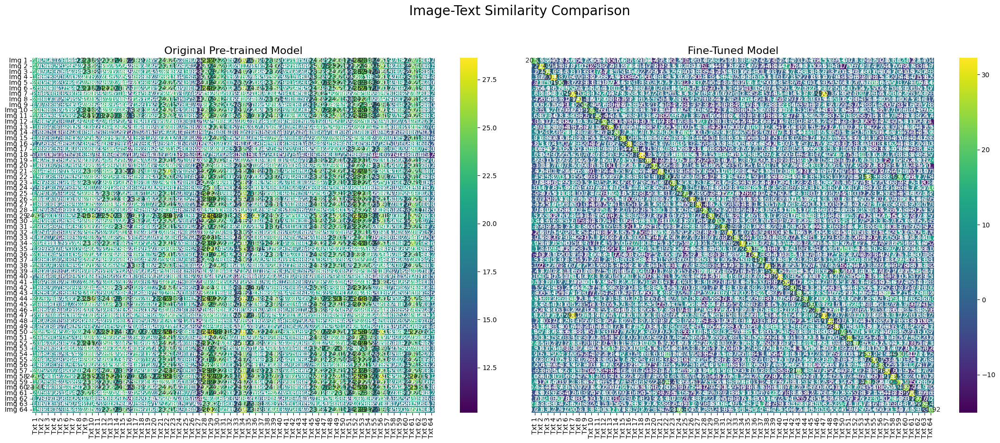

2025-06-24 02:09:20 - [INFO] - --- Heatmap Caption Reference ---
2025-06-24 02:09:20 - [INFO] - Img/Txt 1: LIPA-1 CD36 LPL-1 ITGB2-1 LGMN-1 MSR1-1 EEF1G ANXA2 ARRB2 SLCO2B1-1 CALM3 CD68 MAFB-1 FCGB...
2025-06-24 02:09:20 - [INFO] - Img/Txt 2: AQP3 S100A12-1 EHF CLCA2 MALL-1 FGFBP1 ACTG2 SERPINB2-1 KLK11-1 CXCL2 SERPINB9-1 LY6D-1 SO...
2025-06-24 02:09:20 - [INFO] - Img/Txt 3: ALB SERPINA1-1 APOC1 C3 APOE MT2A-1 RBP4-1 SERPING1-1 ALDOB MT1E-1 CALR CFB C1R NNMT-1 CLU...
2025-06-24 02:09:20 - [INFO] - Img/Txt 4: EGR1 SFRP4-1 MUC1-1 SERPINA3-1 LUM-1 KRT7-1 TACSTD2-1 MMP2-1 TPD52-1 STC2-1 GATA3 POSTN-1 ...
2025-06-24 02:09:20 - [INFO] - Img/Txt 5: SPON2-1 JUNB-1 MT2A-1 FOS PPDPF-1 DHRS7 SEC11C-1 SMS-1 PMEPA1-1 NR4A1-1 MIF-1 ANPEP FOXA1 ...
2025-06-24 02:09:20 - [INFO] - Img/Txt 6: FTH1 MT3-1 CST3 GLUL PTGDS-1 COX6C EIF1 SPARCL1-1 CALM1 CLU CALM2 CXCL14 YWHAZ-1 EEF1A2 UC...
2025-06-24 02:09:20 - [INFO] - Img/Txt 7: A2M ZYG11B-1 ZXDC-1 ZXDB-1 ZWINT-1 ZWILCH-1 ZSWIM7-1 ZSWIM6-1 ACBD5 ACAT2 ACA

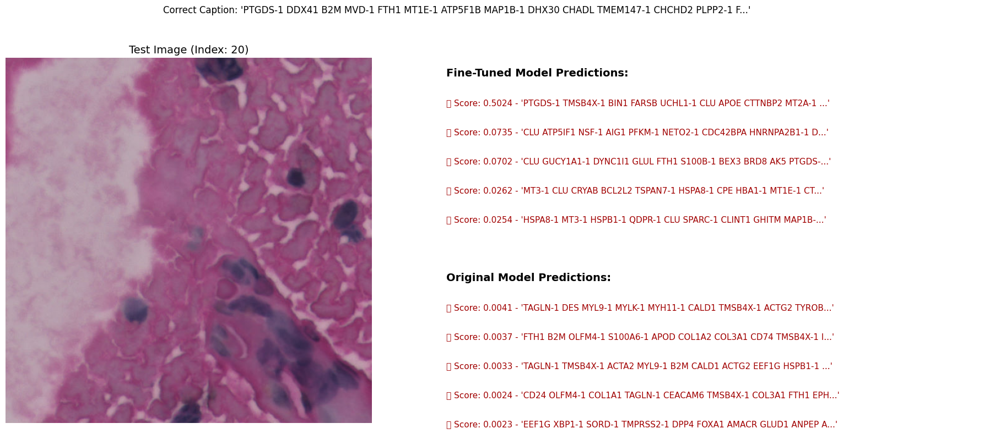

2025-06-24 02:10:01 - [INFO] - ====== Visualization Suite Finished ======


In [26]:


# ==============================================================================
# 3. EXECUTION: RUN THE VISUALIZER
# ==============================================================================

try:
    config.HEATMAP_SAMPLE_SIZE = 64  # Set to a larger sample size for more comprehensive heatmap
    config.QUALITATIVE_SAMPLE_IDX = 20  # Set to a specific index for
    visualizer = ClipVisualizer(config)
    visualizer.run_all_visualizations()

except (FileNotFoundError, RuntimeError, ImportError) as e:
    logging.error(f"An critical error occurred: {e}")
    logging.error("Please check your paths in the VisualizationConfig and ensure all libraries are installed.")
except Exception as e:
    logging.error(f"An unexpected error occurred during execution: {e}", exc_info=True)

2025-06-24 02:17:57 - [INFO] - Initializing ClipVisualizer...
2025-06-24 02:17:57 - [INFO] - Using device: CUDA:2
2025-06-24 02:17:57 - [INFO] - Loading Original Pre-trained model from: /cwStorage/nodecw_group/jijh/openclip_train/open_clip/CLIP-ViT-B-32/open_clip_model.safetensors
2025-06-24 02:17:57 - [INFO] - Parsing model identifier. Schema: None, Identifier: ViT-B-32
2025-06-24 02:17:57 - [INFO] - Loaded built-in ViT-B-32 model config.
2025-06-24 02:17:57 - [INFO] - No potential checkpoint path found from config source or pretrained arg.
2025-06-24 02:17:57 - [INFO] - Instantiating model architecture: CLIP
2025-06-24 02:17:58 - [WARNING] - Model ViT-B-32 initialized partially.
2025-06-24 02:17:58 - [INFO] - Final image preprocessing configuration set: {'size': (224, 224), 'mode': 'RGB', 'mean': (0.48145466, 0.4578275, 0.40821073), 'std': (0.26862954, 0.26130258, 0.27577711), 'interpolation': 'bicubic', 'resize_mode': 'shortest', 'fill_color': 0}
2025-06-24 02:17:58 - [INFO] - Model

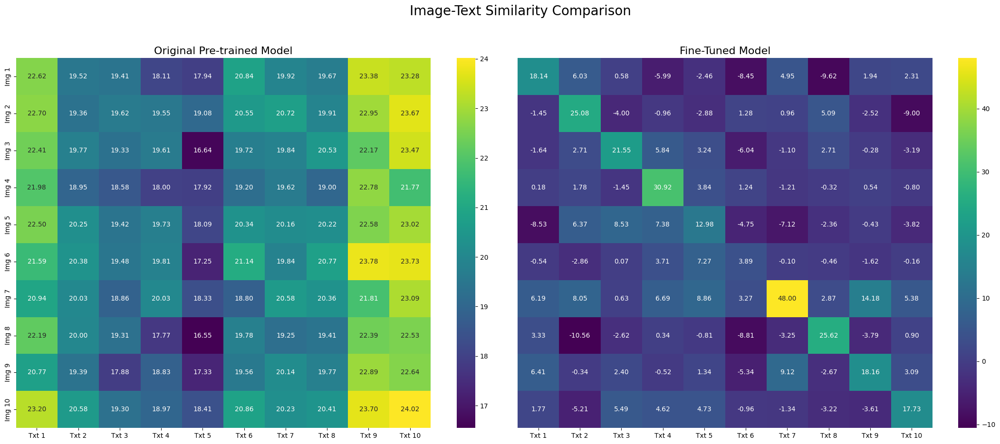

2025-06-24 02:18:03 - [INFO] - --- Heatmap Caption Reference ---
2025-06-24 02:18:03 - [INFO] - Img/Txt 1: LIPA-1 CD36 LPL-1 ITGB2-1 LGMN-1 MSR1-1 EEF1G ANXA2 ARRB2 SLCO2B1-1 CALM3 CD68 MAFB-1 FCGB...
2025-06-24 02:18:03 - [INFO] - Img/Txt 2: AQP3 S100A12-1 EHF CLCA2 MALL-1 FGFBP1 ACTG2 SERPINB2-1 KLK11-1 CXCL2 SERPINB9-1 LY6D-1 SO...
2025-06-24 02:18:03 - [INFO] - Img/Txt 3: ALB SERPINA1-1 APOC1 C3 APOE MT2A-1 RBP4-1 SERPING1-1 ALDOB MT1E-1 CALR CFB C1R NNMT-1 CLU...
2025-06-24 02:18:03 - [INFO] - Img/Txt 4: EGR1 SFRP4-1 MUC1-1 SERPINA3-1 LUM-1 KRT7-1 TACSTD2-1 MMP2-1 TPD52-1 STC2-1 GATA3 POSTN-1 ...
2025-06-24 02:18:03 - [INFO] - Img/Txt 5: SPON2-1 JUNB-1 MT2A-1 FOS PPDPF-1 DHRS7 SEC11C-1 SMS-1 PMEPA1-1 NR4A1-1 MIF-1 ANPEP FOXA1 ...
2025-06-24 02:18:03 - [INFO] - Img/Txt 6: FTH1 MT3-1 CST3 GLUL PTGDS-1 COX6C EIF1 SPARCL1-1 CALM1 CLU CALM2 CXCL14 YWHAZ-1 EEF1A2 UC...
2025-06-24 02:18:03 - [INFO] - Img/Txt 7: A2M ZYG11B-1 ZXDC-1 ZXDB-1 ZWINT-1 ZWILCH-1 ZSWIM7-1 ZSWIM6-1 ACBD5 ACAT2 ACA

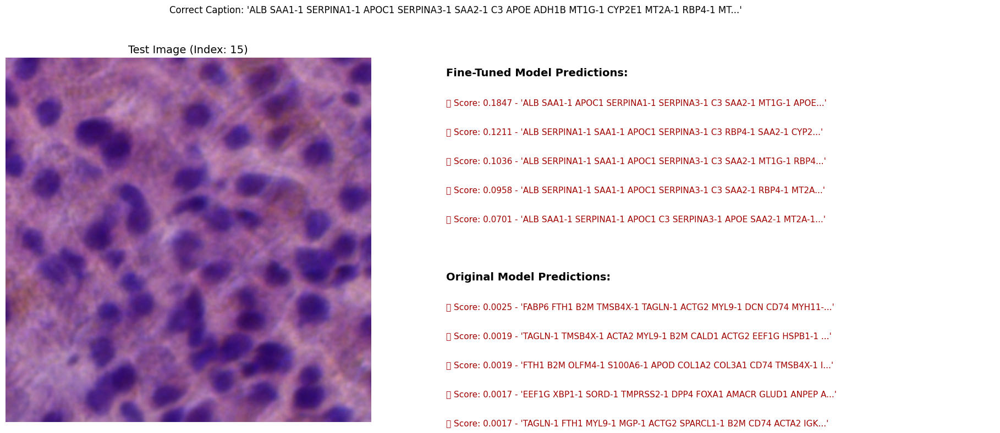

2025-06-24 02:18:43 - [INFO] - ====== Visualization Suite Finished ======


In [28]:


# ==============================================================================
# 3. EXECUTION: RUN THE VISUALIZER
# ==============================================================================

try:
    config.HEATMAP_SAMPLE_SIZE = 10  # Set to a larger sample size for more comprehensive heatmap
    config.QUALITATIVE_SAMPLE_IDX = 15  # Set to a specific index for
    config.FINETUNED_CHECKPOINT_PATH = "/cwStorage/nodecw_group/jijh/training_log/cfff_train/openclip_train/train_log/finetune_20250623-092915/2025_06_23-09_30_48-model_ViT-B-32-lr_2e-05-b_1800-j_16-p_amp_bfloat16/checkpoints/epoch_25.pt"
    visualizer = ClipVisualizer(config)
    visualizer.run_all_visualizations()

except (FileNotFoundError, RuntimeError, ImportError) as e:
    logging.error(f"An critical error occurred: {e}")
    logging.error("Please check your paths in the VisualizationConfig and ensure all libraries are installed.")
except Exception as e:
    logging.error(f"An unexpected error occurred during execution: {e}", exc_info=True)

# Umap

In [14]:
# ==============================================================================
# Full Modified Visualization Script
# ==============================================================================
import os
import sys
import logging
import numpy as np
import pandas as pd
import torch
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import open_clip
from collections import OrderedDict

# Attempt to import safetensors
try:
    from safetensors.torch import load_file as load_safetensors
except ImportError:
    print("Error: The 'safetensors' library is not installed. Please install it with 'pip install safetensors'")
    sys.exit(1)

# [NEW] Attempt to import umap
try:
    import umap
except ImportError:
    print("Error: The 'umap-learn' library is not installed. Please install it with 'pip install umap-learn'")
    sys.exit(1)

# ==============================================================================
# 1. CONFIGURATION: EDIT THIS SECTION
# ==============================================================================
class VisualizationConfig:
    """A central place for all your paths and settings for the visualization."""
    # --- Paths ---
    PROJECT_ROOT = "/cwStorage/nodecw_group/jijh/training_log/cfff_train/openclip_train"

    # Path to the validation manifest CSV
    VAL_MANIFEST = os.path.join(PROJECT_ROOT, "validation_manifest.csv")

    # Path to the ORIGINAL pre-trained model you started with
    PRETRAINED_MODEL_PATH = "/cwStorage/nodecw_group/jijh/openclip_train/open_clip/CLIP-ViT-B-32/open_clip_model.safetensors"

    # Path to your FINAL, fine-tuned checkpoint.
    # IMPORTANT: Update this to point to the checkpoint you want to evaluate.
    FINETUNED_CHECKPOINT_PATH = os.path.join(
        PROJECT_ROOT,
        "train_log/finetune_20250623-060425",  # Replace with your actual log directory
        "2025_06_23-06_06_12-model_ViT-B-32-lr_2e-05-b_1800-j_16-p_amp_bfloat16/checkpoints/epoch_30.pt"
    )

    # --- Model & Device ---
    MODEL_NAME = "ViT-B-32"
    DEVICE = "cuda:2" if torch.cuda.is_available() else "cpu"

    # --- Visualization Sample Sizes ---
    HEATMAP_SAMPLE_SIZE = 8
    QUALITATIVE_SAMPLE_IDX = 15
    UMAP_SAMPLE_SIZE = 200 # [NEW] Sample size for UMAP plot

# ==============================================================================
# 2. VISUALIZATION CLASS: MODIFICATIONS APPLIED
# ==============================================================================
class ClipVisualizer:
    """
    A class to visualize and compare the performance of a fine-tuned OpenCLIP model
    against its original pre-trained version.
    """
    def __init__(self, config: VisualizationConfig):
        """
        Initializes the visualizer by setting up logging, loading models, and data.
        """
        self.config = config
        self._setup_logging()

        logging.info("Initializing ClipVisualizer...")
        logging.info(f"Using device: {self.config.DEVICE.upper()}")

        self.original_model, self.img_processor, self.tokenizer = self._load_model(
            "Original Pre-trained", self.config.PRETRAINED_MODEL_PATH
        )
        self.finetuned_model, _, _ = self._load_model(
            "Fine-tuned", self.config.FINETUNED_CHECKPOINT_PATH
        )
        self.df_val = self._load_validation_data()

    def _setup_logging(self):
        """Configures the logging format and level."""
        logging.basicConfig(
            level=logging.INFO,
            format="%(asctime)s - [%(levelname)s] - %(message)s",
            datefmt="%Y-%m-%d %H:%M:%S"
        )

    def _load_model(self, model_id: str, checkpoint_path: str):
        """
        Loads an OpenCLIP model and its preprocessors robustly from a local file.
        This version automatically handles checkpoints from DistributedDataParallel (DDP) training.
        """
        logging.info(f"Loading {model_id} model from: {checkpoint_path}")

        if not os.path.exists(checkpoint_path):
            logging.error(f"Checkpoint file not found at {checkpoint_path}")
            raise FileNotFoundError(f"Checkpoint file not found at {checkpoint_path}")

        model, _, image_processor = open_clip.create_model_and_transforms(
            self.config.MODEL_NAME,
            pretrained=None,
            device=self.config.DEVICE
        )
        tokenizer = open_clip.get_tokenizer(self.config.MODEL_NAME)

        if checkpoint_path.endswith(".safetensors"):
            state_dict = load_safetensors(checkpoint_path, device=self.config.DEVICE)
        else:
            state_dict = torch.load(checkpoint_path, map_location=self.config.DEVICE)

        if 'state_dict' in state_dict:
            state_dict = state_dict['state_dict']

        if all(key.startswith('module.') for key in state_dict.keys()):
            logging.info("Detected 'module.' prefix from DDP training, stripping it from state_dict keys.")
            stripped_state_dict = OrderedDict()
            for key, value in state_dict.items():
                new_key = key.replace('module.', '', 1)
                stripped_state_dict[new_key] = value
            state_dict = stripped_state_dict

        try:
            model.load_state_dict(state_dict, strict=True)
            logging.info(f"{model_id} model loaded successfully.")
        except RuntimeError as e:
            logging.error(f"Failed to load state dict for {model_id}. Key mismatch error: {e}")
            raise

        model.eval()
        return model, image_processor, tokenizer

    def _load_validation_data(self):
        logging.info(f"Loading validation data from: {self.config.VAL_MANIFEST}")
        df = pd.read_csv(self.config.VAL_MANIFEST)
        # replace old root with new root for *all* image_paths
        old_root = '/cpfs01/projects-HDD/cfff-afe2df89e32e_HDD/jjh_19301050235/my_data/hest_data/'
        new_root = '/cwStorage/nodecw_group/jijh/'
        df['image_path'] = df['image_path'].str.replace(old_root, new_root, regex=False)
        logging.info(f"Successfully loaded validation manifest with {len(df)} samples.")
        return df

    def _get_embeddings(self, model, image_paths: list, captions: list) -> (np.ndarray, np.ndarray):
        """
        [NEW] Encodes a batch of images and texts and returns their normalized embeddings.
        """
        logging.info(f"Generating embeddings for {len(image_paths)} image/text pairs...")
        images = [self.img_processor(Image.open(p).convert("RGB")) for p in image_paths]
        image_tensor = torch.stack(images).to(self.config.DEVICE)
        text_tokens = self.tokenizer(captions).to(self.config.DEVICE)

        with torch.no_grad(), torch.cuda.amp.autocast():
            image_features = model.encode_image(image_tensor)
            text_features = model.encode_text(text_tokens)

            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)

        return image_features.cpu().numpy(), text_features.cpu().numpy()

    def _get_similarity_matrix(self, model, image_paths: list, captions: list) -> np.ndarray:
        """
        Computes the cosine similarity matrix from raw embeddings.
        """
        image_features, text_features = self._get_embeddings(model, image_paths, captions)
        
        # We need the logit_scale from the model to compute the final similarity scores
        with torch.no_grad():
            logit_scale = model.logit_scale.exp().cpu().numpy()

        similarity = (logit_scale * image_features @ text_features.T)
        return similarity

    def plot_similarity_heatmap(self, sample_size: int = 8, random_seed: int = 42):
        """
        Generates and displays side-by-side Image-Text similarity heatmaps.
        """
        logging.info(f"Generating similarity heatmaps using {sample_size} samples...")
        df_sample = self.df_val.sample(n=sample_size, random_state=random_seed)
        image_paths = df_sample['image_path'].tolist()
        captions = df_sample['gene_sentence'].tolist()

        original_sim = self._get_similarity_matrix(self.original_model, image_paths, captions)
        finetuned_sim = self._get_similarity_matrix(self.finetuned_model, image_paths, captions)

        fig, axes = plt.subplots(1, 2, figsize=(22, 10))
        fig.suptitle('Image-Text Similarity Comparison', fontsize=20)

        sns.heatmap(
            original_sim, annot=True, fmt=".2f", cmap='viridis', ax=axes[0],
            xticklabels=[f"Txt {i+1}" for i in range(sample_size)],
            yticklabels=[f"Img {i+1}" for i in range(sample_size)]
        )
        axes[0].set_title('Original Pre-trained Model', fontsize=16)

        sns.heatmap(
            finetuned_sim, annot=True, fmt=".2f", cmap='viridis', ax=axes[1],
            xticklabels=[f"Txt {i+1}" for i in range(sample_size)],
            yticklabels=[]
        )
        axes[1].set_title('Fine-Tuned Model', fontsize=16)

        plt.tight_layout(rect=[0, 0.05, 1, 0.95])
        plt.show()

        logging.info("--- Heatmap Caption Reference ---")
        for i, cap in enumerate(captions):
            logging.info(f"Img/Txt {i+1}: {cap[:90]}...")

    def analyze_top_predictions(self, sample_idx: int):
        """
        Performs a qualitative analysis on a single image, showing the image
        and the top text predictions from both models in a single plot.
        """
        if sample_idx >= len(self.df_val):
            logging.error(f"sample_idx {sample_idx} is out of bounds for validation data of size {len(self.df_val)}.")
            return

        logging.info(f"Analyzing top predictions for sample index: {sample_idx}")
        test_sample = self.df_val.iloc[sample_idx]
        image_path = test_sample['image_path']
        correct_caption = test_sample['gene_sentence']

        # Use all other validation captions as distractors
        distractor_captions = self.df_val['gene_sentence'].tolist()
        if correct_caption not in distractor_captions:
             distractor_captions.append(correct_caption)

        # Get top 5 predictions for each model
        original_preds = self._get_top_k_predictions(
            "Original Model", self.original_model, image_path, correct_caption, distractor_captions, k=5
        )
        finetuned_preds = self._get_top_k_predictions(
            "Fine-Tuned Model", self.finetuned_model, image_path, correct_caption, distractor_captions, k=5
        )

        # --- Create the Visualization ---
        logging.info(f"Displaying test image and predictions: {os.path.basename(image_path)}")
        img = Image.open(image_path)
        
        fig, axes = plt.subplots(1, 2, figsize=(20, 8))
        
        axes[0].imshow(img)
        axes[0].set_title(f"Test Image (Index: {sample_idx})", fontsize=14)
        axes[0].axis('off')
        axes[1].axis('off')
        y_pos = 0.95
        line_height = 0.08

        axes[1].text(0, y_pos, 'Fine-Tuned Model Predictions:', fontsize=14, weight='bold')
        y_pos -= line_height
        for score, caption, is_correct in finetuned_preds:
            color = 'green' if is_correct else '#a10000'
            marker = "✅" if is_correct else "❌"
            axes[1].text(0, y_pos, f"{marker} Score: {score:.4f} - '{caption[:60]}...'", color=color, fontsize=11)
            y_pos -= line_height

        y_pos -= line_height
        axes[1].text(0, y_pos, 'Original Model Predictions:', fontsize=14, weight='bold')
        y_pos -= line_height
        for score, caption, is_correct in original_preds:
            color = 'green' if is_correct else '#a10000'
            marker = "✅" if is_correct else "❌"
            axes[1].text(0, y_pos, f"{marker} Score: {score:.4f} - '{caption[:60]}...'", color=color, fontsize=11)
            y_pos -= line_height
            
        fig.suptitle(f"Correct Caption: '{correct_caption[:90]}...'", fontsize=12, y=0.98)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    def _get_top_k_predictions(self, model_id, model, image_path, correct_caption, all_captions, k=5) -> list:
        """
        Helper to compute and return top k predictions for a given model.
        Returns a list of tuples: (score, caption, is_correct_flag)
        """
        logging.info(f"--- Getting Top {k} Predictions for: {model_id} ---")

        similarity = self._get_similarity_matrix(model, [image_path], all_captions)
        scores = torch.from_numpy(similarity).softmax(dim=-1).squeeze()
        top_k_scores, top_k_indices = torch.topk(scores, k=k)

        predictions = []
        for i in range(k):
            score = top_k_scores[i].item()
            idx = top_k_indices[i].item()
            predicted_caption = all_captions[idx]
            is_correct = (predicted_caption == correct_caption)
            log_marker = "✅ CORRECT" if is_correct else "❌"
            logging.info(f"  {i+1}. Score: {score:.4f} {log_marker} - '{predicted_caption[:90]}...'")
            predictions.append((score, predicted_caption, is_correct))
        
        return predictions

    # ===========================================================================
    # [NEW] UMAP VISUALIZATION METHOD
    # ===========================================================================
    def plot_embedding_umap(self, sample_size: int = 200, random_seed: int = 42):
        """
        Generates and displays a UMAP plot comparing the embedding spaces of the
        original and fine-tuned models.
        """
        logging.info(f"Generating UMAP plot for {sample_size} samples...")
        if sample_size > len(self.df_val):
            logging.warning(f"UMAP sample size ({sample_size}) is larger than validation set ({len(self.df_val)}). Using all samples.")
            sample_size = len(self.df_val)
        
        df_sample = self.df_val.sample(n=sample_size, random_state=random_seed)
        image_paths = df_sample['image_path'].tolist()
        captions = df_sample['gene_sentence'].tolist()
        
        # Get embeddings from both models
        orig_img_embeds, orig_txt_embeds = self._get_embeddings(self.original_model, image_paths, captions)
        ft_img_embeds, ft_txt_embeds = self._get_embeddings(self.finetuned_model, image_paths, captions)
        
        # Combine image and text embeddings for UMAP
        orig_combined_embeds = np.vstack([orig_img_embeds, orig_txt_embeds])
        ft_combined_embeds = np.vstack([ft_img_embeds, ft_txt_embeds])
        
        # Initialize UMAP reducer
        reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, metric='cosine', random_state=random_seed)
        
        # Fit and transform embeddings
        logging.info("Running UMAP on original model embeddings...")
        orig_2d_embeds = reducer.fit_transform(orig_combined_embeds)
        
        logging.info("Running UMAP on fine-tuned model embeddings...")
        ft_2d_embeds = reducer.fit_transform(ft_combined_embeds)
        
        # --- Plotting ---
        fig, axes = plt.subplots(1, 2, figsize=(24, 10))
        fig.suptitle('UMAP of Image and Text Embeddings', fontsize=20)
        
        # Plot for Original Model
        axes[0].scatter(orig_2d_embeds[:sample_size, 0], orig_2d_embeds[:sample_size, 1], c='blue', alpha=0.7, label='Image Embeddings', marker='o')
        axes[0].scatter(orig_2d_embeds[sample_size:, 0], orig_2d_embeds[sample_size:, 1], c='red', alpha=0.7, label='Text Embeddings', marker='x')
        axes[0].set_title('Original Pre-trained Model', fontsize=16)
        axes[0].legend()
        axes[0].set_xticks([])
        axes[0].set_yticks([])
        
        # Plot for Fine-Tuned Model
        axes[1].scatter(ft_2d_embeds[:sample_size, 0], ft_2d_embeds[:sample_size, 1], c='blue', alpha=0.7, label='Image Embeddings', marker='o')
        axes[1].scatter(ft_2d_embeds[sample_size:, 0], ft_2d_embeds[sample_size:, 1], c='red', alpha=0.7, label='Text Embeddings', marker='x')
        axes[1].set_title('Fine-Tuned Model', fontsize=16)
        axes[1].legend()
        axes[1].set_xticks([])
        axes[1].set_yticks([])
        
        # Draw lines connecting corresponding image-text pairs to show alignment
        for i in range(sample_size):
            axes[0].plot([orig_2d_embeds[i, 0], orig_2d_embeds[i+sample_size, 0]], 
                         [orig_2d_embeds[i, 1], orig_2d_embeds[i+sample_size, 1]], 'k-', alpha=0.1)
            axes[1].plot([ft_2d_embeds[i, 0], ft_2d_embeds[i+sample_size, 0]], 
                         [ft_2d_embeds[i, 1], ft_2d_embeds[i+sample_size, 1]], 'k-', alpha=0.2)
        
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

    def run_all_visualizations(self):
        """A convenience method to run a standard suite of visualizations."""
        logging.info("====== Starting Standard Visualization Suite ======")
        self.plot_similarity_heatmap(
            sample_size=self.config.HEATMAP_SAMPLE_SIZE
        )
        self.analyze_top_predictions(
            sample_idx=self.config.QUALITATIVE_SAMPLE_IDX
        )
        # We won't add UMAP here to keep this method fast.
        # It's better to call the UMAP plot separately.
        logging.info("====== Visualization Suite Finished ======")

In [15]:
config = VisualizationConfig()

# Example of changing config for a specific run
config.FINETUNED_CHECKPOINT_PATH = "/cwStorage/nodecw_group/jijh/training_log/cfff_train/openclip_train/train_log/finetune_20250623-092915/2025_06_23-09_30_48-model_ViT-B-32-lr_2e-05-b_1800-j_16-p_amp_bfloat16/checkpoints/epoch_25.pt"
config.HEATMAP_SAMPLE_SIZE = 10
config.QUALITATIVE_SAMPLE_IDX = 15

In [35]:
config = VisualizationConfig()

# Example of changing config for a specific run
config.FINETUNED_CHECKPOINT_PATH = "/cwStorage/nodecw_group/jijh/training_log/cfff_train/openclip_train/train_log/finetune_20250623-092915/2025_06_23-09_30_48-model_ViT-B-32-lr_2e-05-b_1800-j_16-p_amp_bfloat16/checkpoints/epoch_25.pt"
config.HEATMAP_SAMPLE_SIZE = 10
config.QUALITATIVE_SAMPLE_IDX = 15

visualizer = ClipVisualizer(config)

2025-06-27 21:18:48 - [INFO] - Initializing ClipVisualizer...
2025-06-27 21:18:48 - [INFO] - Using device: CUDA:2
2025-06-27 21:18:48 - [INFO] - Loading Original Pre-trained model from: /cwStorage/nodecw_group/jijh/openclip_train/open_clip/CLIP-ViT-B-32/open_clip_model.safetensors
2025-06-27 21:18:48 - [INFO] - Parsing model identifier. Schema: None, Identifier: ViT-B-32
2025-06-27 21:18:48 - [INFO] - Loaded built-in ViT-B-32 model config.
2025-06-27 21:18:48 - [INFO] - No potential checkpoint path found from config source or pretrained arg.
2025-06-27 21:18:48 - [INFO] - Instantiating model architecture: CLIP
2025-06-27 21:18:49 - [WARNING] - Model ViT-B-32 initialized partially.
2025-06-27 21:18:49 - [INFO] - Final image preprocessing configuration set: {'size': (224, 224), 'mode': 'RGB', 'mean': (0.48145466, 0.4578275, 0.40821073), 'std': (0.26862954, 0.26130258, 0.27577711), 'interpolation': 'bicubic', 'resize_mode': 'shortest', 'fill_color': 0}
2025-06-27 21:18:49 - [INFO] - Model

2025-06-25 21:13:38 - [INFO] - Initializing ClipVisualizer...
2025-06-25 21:13:38 - [INFO] - Using device: CUDA:2
2025-06-25 21:13:38 - [INFO] - Loading Original Pre-trained model from: /cwStorage/nodecw_group/jijh/openclip_train/open_clip/CLIP-ViT-B-32/open_clip_model.safetensors
2025-06-25 21:13:38 - [INFO] - Parsing model identifier. Schema: None, Identifier: ViT-B-32
2025-06-25 21:13:38 - [INFO] - Loaded built-in ViT-B-32 model config.
2025-06-25 21:13:38 - [INFO] - No potential checkpoint path found from config source or pretrained arg.
2025-06-25 21:13:38 - [INFO] - Instantiating model architecture: CLIP
2025-06-25 21:13:40 - [WARNING] - Model ViT-B-32 initialized partially.
2025-06-25 21:13:40 - [INFO] - Final image preprocessing configuration set: {'size': (224, 224), 'mode': 'RGB', 'mean': (0.48145466, 0.4578275, 0.40821073), 'std': (0.26862954, 0.26130258, 0.27577711), 'interpolation': 'bicubic', 'resize_mode': 'shortest', 'fill_color': 0}
2025-06-25 21:13:40 - [INFO] - Model

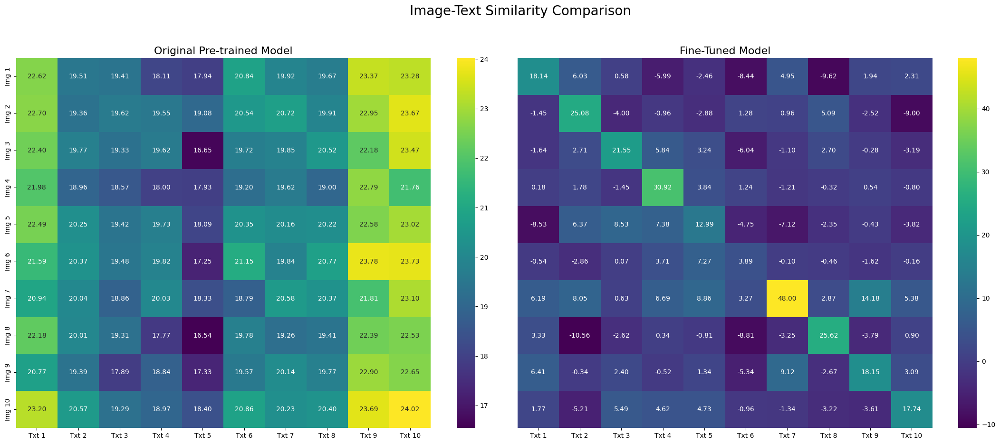

2025-06-25 21:13:46 - [INFO] - --- Heatmap Caption Reference ---
2025-06-25 21:13:46 - [INFO] - Img/Txt 1: LIPA-1 CD36 LPL-1 ITGB2-1 LGMN-1 MSR1-1 EEF1G ANXA2 ARRB2 SLCO2B1-1 CALM3 CD68 MAFB-1 FCGB...
2025-06-25 21:13:46 - [INFO] - Img/Txt 2: AQP3 S100A12-1 EHF CLCA2 MALL-1 FGFBP1 ACTG2 SERPINB2-1 KLK11-1 CXCL2 SERPINB9-1 LY6D-1 SO...
2025-06-25 21:13:46 - [INFO] - Img/Txt 3: ALB SERPINA1-1 APOC1 C3 APOE MT2A-1 RBP4-1 SERPING1-1 ALDOB MT1E-1 CALR CFB C1R NNMT-1 CLU...
2025-06-25 21:13:46 - [INFO] - Img/Txt 4: EGR1 SFRP4-1 MUC1-1 SERPINA3-1 LUM-1 KRT7-1 TACSTD2-1 MMP2-1 TPD52-1 STC2-1 GATA3 POSTN-1 ...
2025-06-25 21:13:46 - [INFO] - Img/Txt 5: SPON2-1 JUNB-1 MT2A-1 FOS PPDPF-1 DHRS7 SEC11C-1 SMS-1 PMEPA1-1 NR4A1-1 MIF-1 ANPEP FOXA1 ...
2025-06-25 21:13:46 - [INFO] - Img/Txt 6: FTH1 MT3-1 CST3 GLUL PTGDS-1 COX6C EIF1 SPARCL1-1 CALM1 CLU CALM2 CXCL14 YWHAZ-1 EEF1A2 UC...
2025-06-25 21:13:46 - [INFO] - Img/Txt 7: A2M ZYG11B-1 ZXDC-1 ZXDB-1 ZWINT-1 ZWILCH-1 ZSWIM7-1 ZSWIM6-1 ACBD5 ACAT2 ACA

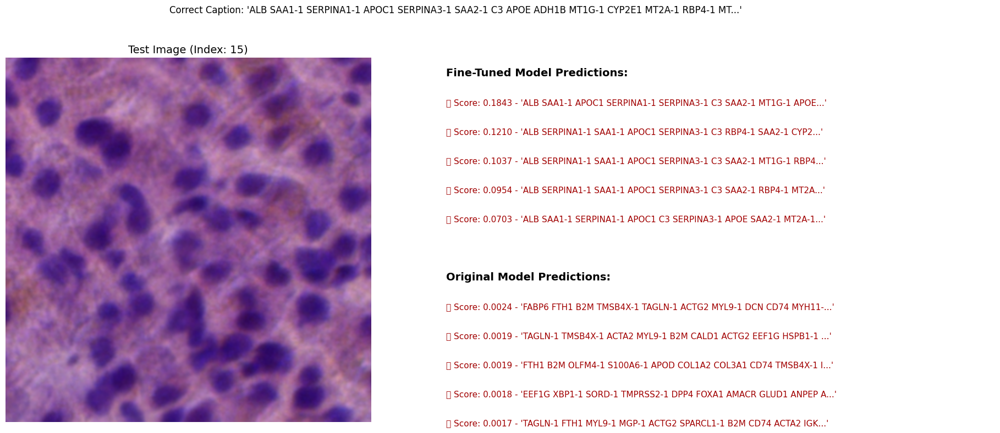

2025-06-25 21:14:28 - [INFO] - ====== Visualization Suite Finished ======
2025-06-25 21:14:28 - [INFO] - 

====== Starting UMAP Embedding Visualization ======
2025-06-25 21:14:28 - [INFO] - Generating UMAP plot for 200 samples...
2025-06-25 21:14:28 - [INFO] - Generating embeddings for 200 image/text pairs...
2025-06-25 21:14:30 - [INFO] - Generating embeddings for 200 image/text pairs...
2025-06-25 21:14:31 - [INFO] - Running UMAP on original model embeddings...
/public/home/jijh/micromamba/envs/gigapath/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
2025-06-25 21:14:40 - [INFO] - Running UMAP on fine-tuned model embeddings...


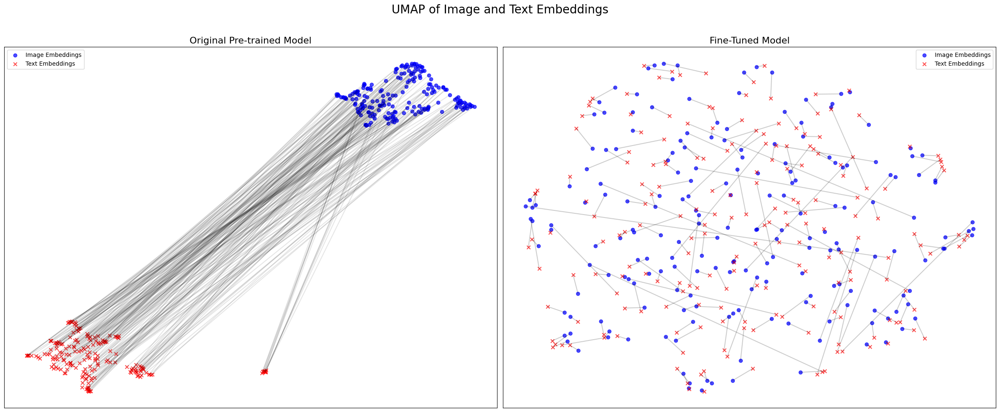

2025-06-25 21:14:41 - [INFO] - ====== UMAP Visualization Finished ======


In [ ]:



# ==============================================================================
# 3. EXECUTION: RUN THE VISUALIZER
# ==============================================================================

# --- First Execution Block (Original Request) ---
try:

    visualizer.run_all_visualizations()

except (FileNotFoundError, RuntimeError, ImportError) as e:
    logging.error(f"An critical error occurred: {e}")
    logging.error("Please check your paths in the VisualizationConfig and ensure all libraries are installed.")
except Exception as e:
    logging.error(f"An unexpected error occurred during execution: {e}", exc_info=True)


# ==============================================================================
# 4. [NEW] EXECUTION FOR UMAP VISUALIZATION
# ==============================================================================
# You can run this block separately after the one above.
# It re-uses the 'visualizer' object that has already loaded the models.

try:
    logging.info("\n\n====== Starting UMAP Embedding Visualization ======")
    # You can adjust the sample size here if needed.
    # Larger sizes give a better view of the global structure but take longer.
    visualizer.plot_embedding_umap(
        sample_size=config.UMAP_SAMPLE_SIZE
    )
    logging.info("====== UMAP Visualization Finished ======")

except NameError:
     logging.error("The 'visualizer' object was not created. Please run the previous cell first.")
except Exception as e:
    logging.error(f"An unexpected error occurred during UMAP visualization: {e}", exc_info=True)

# Metris

In [ ]:
config= VisualizationConfig()

In [33]:
config.EVAL_SAMPLE_SIZE

# 然后再：
evaluator = ClipEvaluator(visualizer)

2025-06-27 21:17:57 - [INFO] - ClipEvaluator initialized.


2025-06-27 21:19:02 - [INFO] - 

====== Starting Quantitative Metric Evaluation ======
2025-06-27 21:19:02 - [INFO] - ClipEvaluator initialized.
2025-06-27 21:19:02 - [INFO] - Starting quantitative evaluation on 500 samples...
2025-06-27 21:19:02 - [INFO] - Calculating embeddings for the original model...


Embedding Original:   0%|          | 0/8 [00:00<?, ?it/s]

/tmp/ipykernel_8728/1562142414.py:54: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
2025-06-27 21:19:08 - [INFO] - Calculating embeddings for the fine-tuned model...


Embedding Fine-tuned:   0%|          | 0/8 [00:00<?, ?it/s]

2025-06-27 21:19:11 - [INFO] - Computing metrics for the original model...
2025-06-27 21:19:11 - [INFO] - Computing metrics for the fine-tuned model...



               METRIC RESULTS
Metric          | Original Model   | Fine-Tuned Model
--------------------------------------------------
I2T R1         | 0.00             | 79.40           
I2T R5         | 1.00             | 94.80           
I2T R10        | 1.80             | 96.80           
I2T MRR        | 0.01             | 0.86            
--------------------------------------------------
T2I R1         | 0.20             | 75.80           
T2I R5         | 1.00             | 94.00           
T2I R10        | 1.80             | 96.80           
T2I MRR        | 0.01             | 0.84            


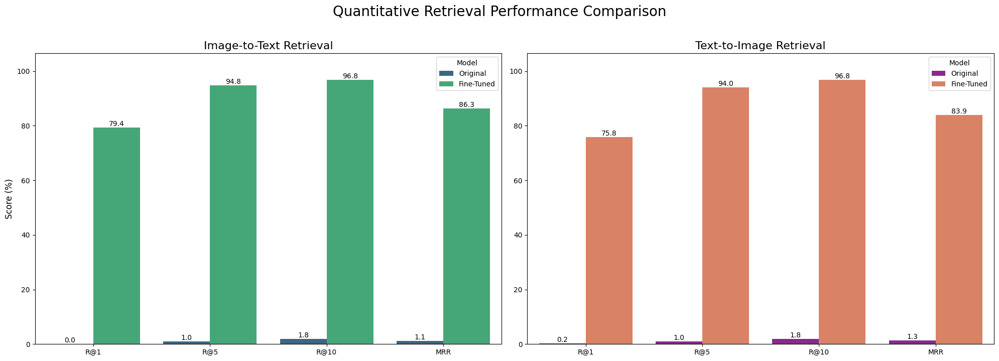

2025-06-27 21:19:12 - [INFO] - ====== Quantitative Evaluation Finished ======


In [36]:
# ==============================================================================
# 4. QUANTITATIVE EVALUATION: NEW CELL
# ==============================================================================
import pandas as pd
import numpy as np
import torch
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.auto import tqdm # For progress bars

# Add a new setting to the config for evaluation sample size
# We add it here dynamically to avoid re-running the whole notebook.
# For a final, robust evaluation, set this to len(visualizer.df_val)
config.EVAL_SAMPLE_SIZE = 500 # Use 500 samples for a quick but meaningful evaluation

class ClipEvaluator:
    """
    A class dedicated to computing and plotting quantitative retrieval metrics
    for CLIP models.
    """
    def __init__(self, visualizer: ClipVisualizer):
        """
        Initializes the evaluator using an existing ClipVisualizer instance.
        """
        self.config = visualizer.config
        self.original_model = visualizer.original_model
        self.finetuned_model = visualizer.finetuned_model
        self.df_val = visualizer.df_val
        self.img_processor = visualizer.img_processor
        self.tokenizer = visualizer.tokenizer
        self.device = self.config.DEVICE
        logging.info("ClipEvaluator initialized.")

    def _get_all_embeddings(self, model, df_sample, batch_size=64):
        """
        Computes embeddings for all images and texts in the provided dataframe sample,
        using batching to manage memory.
        """
        num_samples = len(df_sample)
        image_embeds_list = []
        text_embeds_list = []

        # Create a generator for batches
        for i in tqdm(range(0, num_samples, batch_size), desc=f"Embedding {model.model_name}"):
            batch_df = df_sample.iloc[i:i+batch_size]
            image_paths = batch_df['image_path'].tolist()
            captions = batch_df['gene_sentence'].tolist()
            
            # This is a simplified version of the _get_embeddings from the Visualizer
            images = [self.img_processor(Image.open(p).convert("RGB")) for p in image_paths]
            image_tensor = torch.stack(images).to(self.device)
            text_tokens = self.tokenizer(captions).to(self.device)

            with torch.no_grad(), torch.cuda.amp.autocast():
                image_features = model.encode_image(image_tensor)
                text_features = model.encode_text(text_tokens)
                
                image_features /= image_features.norm(dim=-1, keepdim=True)
                text_features /= text_features.norm(dim=-1, keepdim=True)

            image_embeds_list.append(image_features.cpu())
            text_embeds_list.append(text_features.cpu())

        return torch.cat(image_embeds_list), torch.cat(text_embeds_list)

    def calculate_retrieval_metrics(self):
        """
        Calculates R@K and MRR for both I2T and T2I retrieval for both models.
        """
        # Ensure the sample size is not larger than the dataset
        sample_size = min(self.config.EVAL_SAMPLE_SIZE, len(self.df_val))
        df_sample = self.df_val.sample(n=sample_size, random_state=42)
        
        logging.info(f"Starting quantitative evaluation on {sample_size} samples...")
        
        # --- Get Embeddings ---
        logging.info("Calculating embeddings for the original model...")
        self.original_model.model_name = "Original" # for progress bar
        orig_img_embeds, orig_txt_embeds = self._get_all_embeddings(self.original_model, df_sample)

        logging.info("Calculating embeddings for the fine-tuned model...")
        self.finetuned_model.model_name = "Fine-tuned" # for progress bar
        ft_img_embeds, ft_txt_embeds = self._get_all_embeddings(self.finetuned_model, df_sample)

        # --- Calculate Metrics ---
        logging.info("Computing metrics for the original model...")
        metrics_original = self._compute_metrics_from_embeds(orig_img_embeds, orig_txt_embeds)
        
        logging.info("Computing metrics for the fine-tuned model...")
        metrics_finetuned = self._compute_metrics_from_embeds(ft_img_embeds, ft_txt_embeds)
        
        return metrics_original, metrics_finetuned

    def _compute_metrics_from_embeds(self, image_features, text_features):
        """Helper function to compute metrics from a set of embeddings."""
        # Calculate the full similarity matrix
        sim_matrix = (image_features @ text_features.T).cpu()
        num_samples = sim_matrix.shape[0]
        
        # Ground truth is that image `i` matches text `i`, which corresponds to the diagonal
        ground_truth = torch.arange(num_samples).view(-1, 1)

        # --- Image-to-Text Retrieval ---
        i2t_ranks = (sim_matrix.argsort(dim=1, descending=True) == ground_truth).nonzero(as_tuple=True)[1] + 1
        
        # --- Text-to-Image Retrieval ---
        t2i_ranks = (sim_matrix.T.argsort(dim=1, descending=True) == ground_truth).nonzero(as_tuple=True)[1] + 1
        
        metrics = {}
        # Calculate R@K and MRR for Image-to-Text
        metrics['i2t_r1'] = (i2t_ranks <= 1).float().mean().item() * 100
        metrics['i2t_r5'] = (i2t_ranks <= 5).float().mean().item() * 100
        metrics['i2t_r10'] = (i2t_ranks <= 10).float().mean().item() * 100
        metrics['i2t_mrr'] = (1.0 / i2t_ranks.float()).mean().item()

        # Calculate R@K and MRR for Text-to-Image
        metrics['t2i_r1'] = (t2i_ranks <= 1).float().mean().item() * 100
        metrics['t2i_r5'] = (t2i_ranks <= 5).float().mean().item() * 100
        metrics['t2i_r10'] = (t2i_ranks <= 10).float().mean().item() * 100
        metrics['t2i_mrr'] = (1.0 / t2i_ranks.float()).mean().item()

        return metrics

    def plot_metrics_comparison(self, metrics_original, metrics_finetuned):
        """
        Generates and displays bar charts comparing the performance metrics.
        """
        # Prepare data for plotting
        metric_labels = ['R@1', 'R@5', 'R@10', 'MRR']
        
        i2t_data = {
            'Metric': metric_labels * 2,
            'Score': [
                metrics_original['i2t_r1'], metrics_original['i2t_r5'], metrics_original['i2t_r10'], metrics_original['i2t_mrr'] * 100, # scale MRR to %
                metrics_finetuned['i2t_r1'], metrics_finetuned['i2t_r5'], metrics_finetuned['i2t_r10'], metrics_finetuned['i2t_mrr'] * 100
            ],
            'Model': ['Original'] * 4 + ['Fine-Tuned'] * 4
        }
        df_i2t = pd.DataFrame(i2t_data)
        
        t2i_data = {
            'Metric': metric_labels * 2,
            'Score': [
                metrics_original['t2i_r1'], metrics_original['t2i_r5'], metrics_original['t2i_r10'], metrics_original['t2i_mrr'] * 100,
                metrics_finetuned['t2i_r1'], metrics_finetuned['t2i_r5'], metrics_finetuned['t2i_r10'], metrics_finetuned['t2i_mrr'] * 100
            ],
            'Model': ['Original'] * 4 + ['Fine-Tuned'] * 4
        }
        df_t2i = pd.DataFrame(t2i_data)

        # Create plots
        fig, axes = plt.subplots(1, 2, figsize=(20, 7))
        fig.suptitle('Quantitative Retrieval Performance Comparison', fontsize=20, y=1.02)
        
        # --- Image-to-Text Plot ---
        ax1 = sns.barplot(x='Metric', y='Score', hue='Model', data=df_i2t, ax=axes[0], palette='viridis')
        ax1.set_title('Image-to-Text Retrieval', fontsize=16)
        ax1.set_ylabel('Score (%)', fontsize=12)
        ax1.set_xlabel('')
        ax1.bar_label(ax1.containers[0], fmt='%.1f')
        ax1.bar_label(ax1.containers[1], fmt='%.1f')
        ax1.set_ylim(0, max(df_i2t['Score'].max(), df_t2i['Score'].max()) * 1.1)

        # --- Text-to-Image Plot ---
        ax2 = sns.barplot(x='Metric', y='Score', hue='Model', data=df_t2i, ax=axes[1], palette='plasma')
        ax2.set_title('Text-to-Image Retrieval', fontsize=16)
        ax2.set_ylabel('')
        ax2.set_xlabel('')
        ax2.bar_label(ax2.containers[0], fmt='%.1f')
        ax2.bar_label(ax2.containers[1], fmt='%.1f')
        ax2.set_ylim(0, max(df_i2t['Score'].max(), df_t2i['Score'].max()) * 1.1)
        
        plt.tight_layout()
        plt.show()

# ==============================================================================
# 5. EXECUTION FOR QUANTITATIVE EVALUATION
# ==============================================================================
# This assumes the 'visualizer' object from the previous cells still exists and has loaded the models.
try:
    logging.info("\n\n====== Starting Quantitative Metric Evaluation ======")
    
    # Initialize the evaluator with the pre-loaded models from the visualizer
    evaluator = ClipEvaluator(visualizer)
    
    # Calculate all metrics
    metrics_orig, metrics_ft = evaluator.calculate_retrieval_metrics()
    
    # Print the results in a clean table format
    print("\n" + "="*50)
    print(" " * 15 + "METRIC RESULTS")
    print("="*50)
    print(f"{'Metric':<15} | {'Original Model':<16} | {'Fine-Tuned Model':<16}")
    print("-"*50)
    for metric in ['r1', 'r5', 'r10', 'mrr']:
        key_i2t = f'i2t_{metric}'
        orig_val = f"{metrics_orig[key_i2t]:.2f}"
        ft_val = f"{metrics_ft[key_i2t]:.2f}"
        print(f"I2T {metric.upper():<10} | {orig_val:<16} | {ft_val:<16}")
    print("-"*50)
    for metric in ['r1', 'r5', 'r10', 'mrr']:
        key_t2i = f't2i_{metric}'
        orig_val = f"{metrics_orig[key_t2i]:.2f}"
        ft_val = f"{metrics_ft[key_t2i]:.2f}"
        print(f"T2I {metric.upper():<10} | {orig_val:<16} | {ft_val:<16}")
    print("="*50)

    # Plot the comparison charts
    evaluator.plot_metrics_comparison(metrics_orig, metrics_ft)
    
    logging.info("====== Quantitative Evaluation Finished ======")

except NameError:
    logging.error("The 'visualizer' object was not created. Please run the previous cells first.")
except Exception as e:
    logging.error(f"An unexpected error occurred during quantitative evaluation: {e}", exc_info=True)

# Check metadata 

In [8]:
# --- 安装必要的库 ---
# 请确保您已按照上述说明安装了 libvips 系统库
# pip install pyvips opencv-python scikit-image tqdm

import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.color import rgb2hed
from skimage.filters import threshold_otsu
from IPython.display import display, Image as IPImage

# 导入 pyvips 库
try:
    import pyvips
except ImportError:
    print("错误: pyvips 库未找到。请按照单元格上方的说明进行安装。")
    # 在 Notebook 中，我们可以用 raise 来停止执行
    raise

# 使用 tqdm.notebook 可以在 Notebook 中显示更好看的进度条
from tqdm.auto import tqdm

os.chdir("/home1/jijh/diffusion_project/ADiffusion")
os.getcwd()

import importlib
from src.pipeline.hest_loading import HESTDataset, HESTSample

# --- 全局设置 ---
DATA_DIR = "/cwStorage/nodecw_group/jijh/hest_1k" 

# 1. 初始化数据集
print(f"正在从 '{DATA_DIR}' 加载数据集...")
dataset = HESTDataset(data_dir=DATA_DIR)
print("数据集元数据加载成功。")

# 2. 选择样本进行分析
print("\n正在查询所有样本以进行高分辨率 WSI QC 分析...")
samples_to_analyze = dataset.get_samples(species="Homo sapiens")
print(f"总共找到 {len(samples_to_analyze)} 个样本。")

正在从 '/cwStorage/nodecw_group/jijh/hest_1k' 加载数据集...
数据集元数据加载成功。

正在查询所有样本以进行高分辨率 WSI QC 分析...
总共找到 649 个样本。


In [11]:
print(dataset.meta_df.head())

                                       dataset_title       id image_filename  \
0  Fresh Frozen Mouse Brain Hemisphere with 5K Mo...  TENX159    TENX159.tif   
1  FFPE Human Skin Primary Dermal Melanoma with 5...  TENX158    TENX158.tif   
2  FFPE Human Prostate Adenocarcinoma with 5K Hum...  TENX157    TENX157.tif   
3  Characterization of immune cell populations in...  TENX156    TENX156.tif   
4  Characterization of immune cell populations in...  TENX155    TENX155.tif   

      organ disease_state oncotree_code       species    patient  \
0     Brain       Healthy           NaN  Mus musculus        NaN   
1      Skin        Cancer          SKCM  Homo sapiens        NaN   
2  Prostate        Cancer          PRAD  Homo sapiens        NaN   
3     Bowel        Cancer          COAD  Homo sapiens  Patient 1   
4     Bowel        Cancer          COAD  Homo sapiens  Patient 1   

  st_technology data_publication_date  ... treatment_comment  \
0        Xenium               7/31/24  ...    

2025-06-27 21:36:34 - [INFO] - ====== Starting Metadata-Driven UMAP Visualization ======
2025-06-27 21:36:34 - [INFO] - Initializing MetadataUMAPVisualizer...
2025-06-27 21:36:34 - [INFO] - Merging validation manifest with biological metadata...
2025-06-27 21:36:34 - [INFO] - 成功从路径中提取ID，例如: MISC19
2025-06-27 21:36:34 - [INFO] - 合并完成: 47443 / 47443 个验证样本成功匹配到元数据。


Calculating Image Embeddings:   0%|          | 0/63 [00:00<?, ?it/s]

/tmp/ipykernel_8728/4243127900.py:67: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
/public/home/jijh/micromamba/envs/gigapath/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


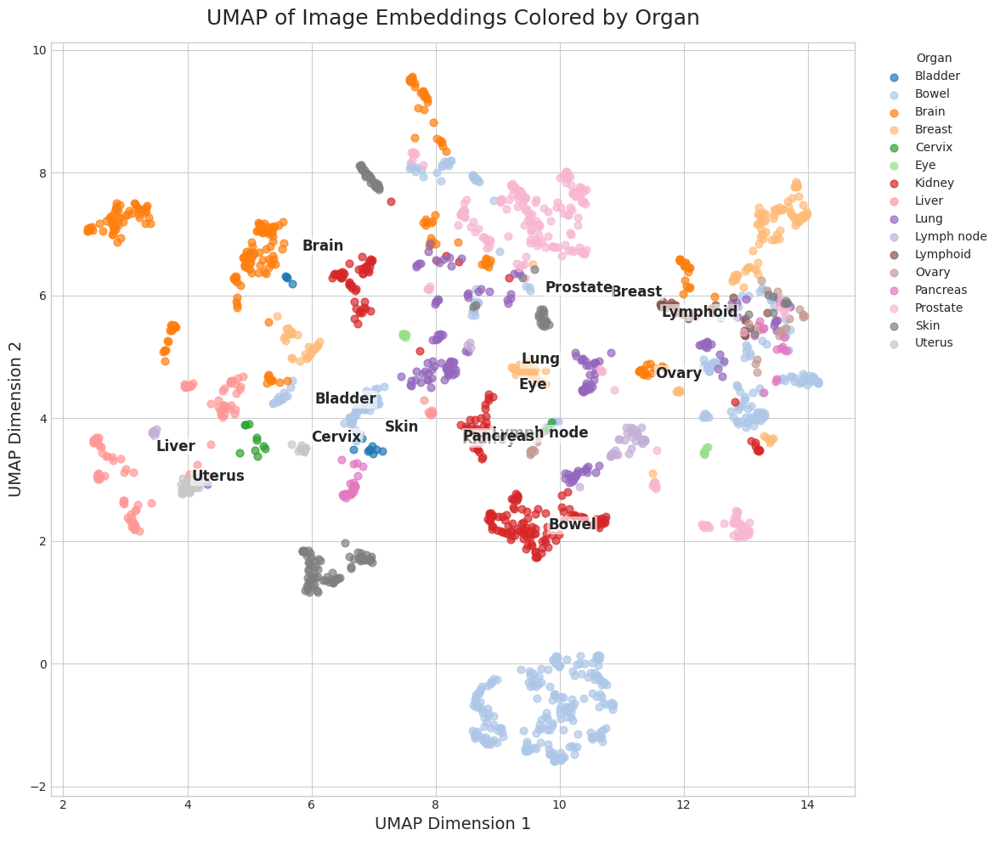

Calculating Image Embeddings:   0%|          | 0/63 [00:00<?, ?it/s]

/tmp/ipykernel_8728/4243127900.py:67: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
/public/home/jijh/micromamba/envs/gigapath/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


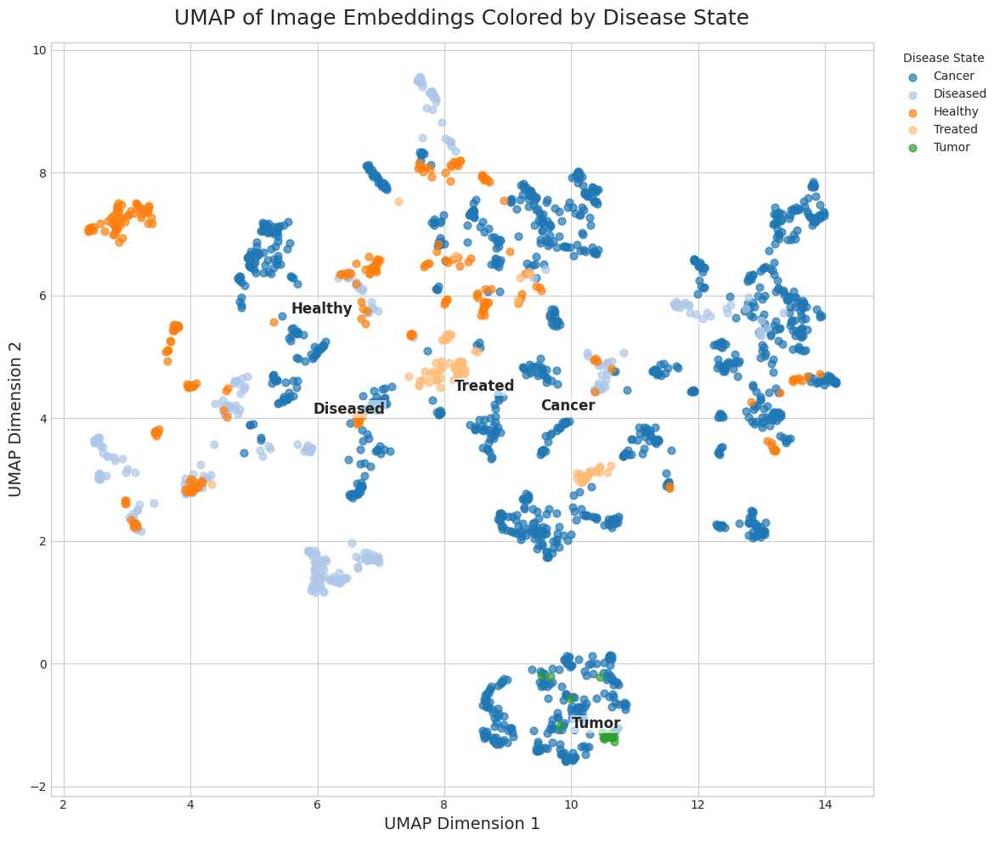

Calculating Image Embeddings:   0%|          | 0/63 [00:00<?, ?it/s]

/tmp/ipykernel_8728/4243127900.py:67: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
/public/home/jijh/micromamba/envs/gigapath/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


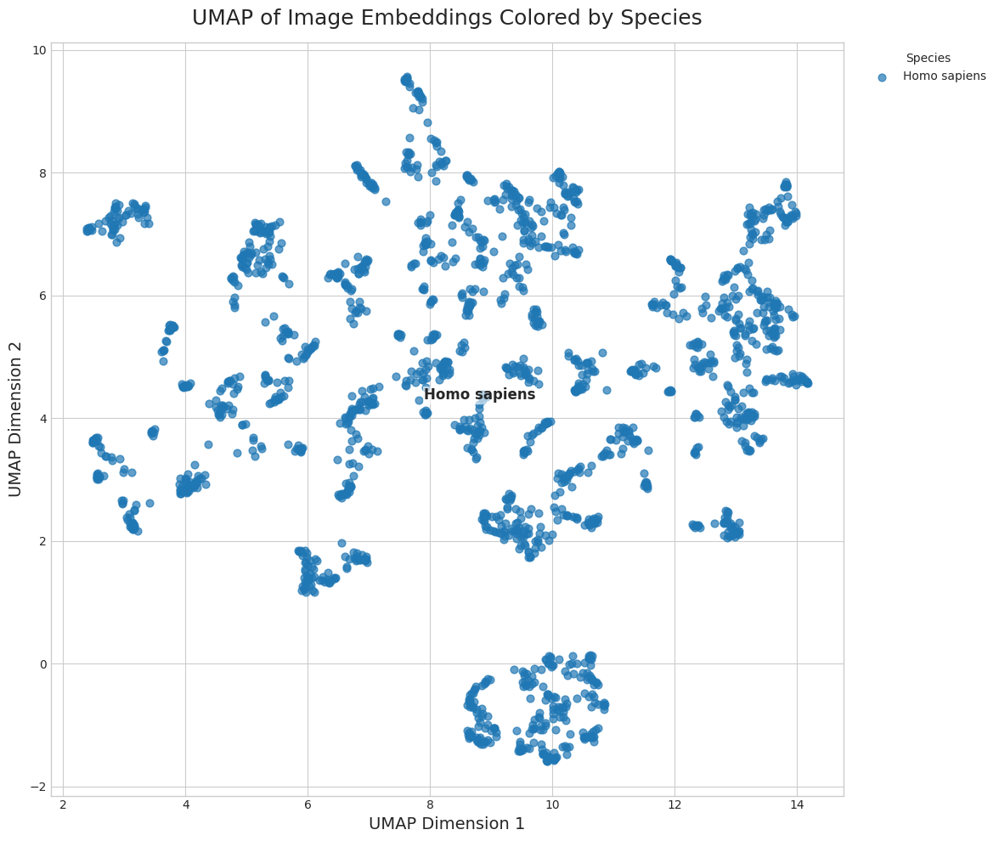

2025-06-27 21:38:28 - [INFO] - ====== Metadata-Driven UMAP Visualization Finished ======


In [38]:
import os
import logging
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from tqdm.auto import tqdm

try:
    import umap
except ImportError:
    print("错误: The 'umap-learn' library is not installed. 请先安装 'pip install umap-learn'")
    raise

class MetadataUMAPVisualizer:
    """
    一个专门用于根据生物学元数据，对CLIP模型图像嵌入进行UMAP可视化的类。
    """
    def __init__(self, visualizer, meta_df: pd.DataFrame):
        """
        使用一个已初始化的 ClipVisualizer 和元数据DataFrame进行初始化。
        """
        self.config = visualizer.config
        self.model = visualizer.finetuned_model
        self.img_processor = visualizer.img_processor
        self.device = self.config.DEVICE

        logging.info("Initializing MetadataUMAPVisualizer...")
        # 合并验证集与元数据
        self.df_merged = self._merge_metadata(visualizer.df_val, meta_df)

    def _merge_metadata(self, df_val: pd.DataFrame, df_meta: pd.DataFrame) -> pd.DataFrame:
        """
        通过从图像路径中提取ID，将验证清单与元数据进行合并。
        """
        logging.info("Merging validation manifest with biological metadata...")
        try:
            df_val['id'] = df_val['image_path'].apply(
                lambda p: os.path.basename(os.path.dirname(p)).split('_')[0]
            )
            logging.info(f"成功从路径中提取ID，例如: {df_val['id'].iloc[0]}")
        except Exception as e:
            logging.error(f"从路径中提取ID失败，请检查路径格式。错误: {e}")
            return df_val

        df_merged = pd.merge(df_val, df_meta, on='id', how='left')
        num_matched = df_merged['organ'].notna().sum()
        num_total = len(df_merged)
        logging.info(f"合并完成: {num_matched} / {num_total} 个验证样本成功匹配到元数据。")
        if num_matched < num_total:
            logging.warning(f"有 {num_total - num_matched} 个样本未能找到匹配的元数据。")
        return df_merged

    def _get_image_embeddings(self, image_paths: list, batch_size: int = 32) -> np.ndarray:
        """
        为给定的图像路径列表批量计算图像嵌入。
        """
        all_embeds = []
        self.model.eval()

        for i in tqdm(range(0, len(image_paths), batch_size), desc="Calculating Image Embeddings"):
            batch_paths = image_paths[i:i+batch_size]
            images = [self.img_processor(Image.open(p).convert("RGB")) for p in batch_paths]
            image_tensor = torch.stack(images).to(self.device)

            with torch.no_grad(), torch.cuda.amp.autocast():
                image_features = self.model.encode_image(image_tensor)
                image_features /= image_features.norm(dim=-1, keepdim=True)
                all_embeds.append(image_features.cpu().numpy())

        return np.vstack(all_embeds)

    def plot_umap_by_metadata(self, tag_column: str, sample_size: int = 1000, random_seed: int = 42):
        """
        生成按指定元数据列着色并在簇质心标注的UMAP图。
        Args:
            tag_column (str): 用于着色的元数据列名 (例如 'organ', 'disease_state').
            sample_size (int): 用于可视化的样本数量。
            random_seed (int): 用于可复现采样的随机种子。
        """
        if tag_column not in self.df_merged.columns:
            logging.error(f"错误: 指定的标签列 '{tag_column}' 不在合并后的元数据中。可用列: {self.df_merged.columns.tolist()}")
            return

        df_tagged = self.df_merged.dropna(subset=[tag_column])
        if len(df_tagged) < sample_size:
            logging.warning(f"可用样本 ({len(df_tagged)}) 少于指定 ({sample_size})，使用全部可用样本。")
            sample_size = len(df_tagged)
        df_sample = df_tagged.sample(n=sample_size, random_state=random_seed)

        image_paths = df_sample['image_path'].tolist()
        labels = df_sample[tag_column].tolist()

        # 计算嵌入
        image_embeds = self._get_image_embeddings(image_paths)

        # UMAP降维
        reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2,
                            metric='cosine', random_state=random_seed)
        embeds_2d = reducer.fit_transform(image_embeds)

        # 绘制
        plt.style.use('seaborn-v0_8-whitegrid')
        fig, ax = plt.subplots(figsize=(14, 10))

        unique_labels = sorted(set(labels))
        num_labels = len(unique_labels)
        base_cmap = plt.get_cmap('tab20')
        colors = base_cmap.colors if num_labels <= 20 else base_cmap(np.linspace(0, 1, num_labels))
        cmap = ListedColormap(colors[:num_labels])

        for idx, label in enumerate(unique_labels):
            mask = [l == label for l in labels]
            ax.scatter(
                embeds_2d[mask, 0],
                embeds_2d[mask, 1],
                c=[cmap(idx)],
                label=label,
                alpha=0.7,
                s=40
            )
            centroid = embeds_2d[mask].mean(axis=0)
            ax.text(
                centroid[0], centroid[1], label,
                fontsize=12, weight='bold',
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', pad=1)
            )

        ax.legend(title=tag_column.replace('_', ' ').title(),
                  bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)
        ax.set_title(f"UMAP of Image Embeddings Colored by {tag_column.replace('_', ' ').title()}",
                     fontsize=18, pad=15)
        ax.set_xlabel("UMAP Dimension 1", fontsize=14)
        ax.set_ylabel("UMAP Dimension 2", fontsize=14)
        fig.tight_layout(rect=[0, 0, 0.85, 1])

        plt.show()


# ============================ 执行示例 ============================
if __name__ == '__main__':
    try:
        logging.info("====== Starting Metadata-Driven UMAP Visualization ======")

        # 假设 visualizer 和 dataset.meta_df 已初始化
        meta_visualizer = MetadataUMAPVisualizer(visualizer, dataset.meta_df)

        for tag in ['organ', 'disease_state', 'species']:
            meta_visualizer.plot_umap_by_metadata(
                tag_column=tag,
                sample_size=2000,
                random_seed=42
            )

        logging.info("====== Metadata-Driven UMAP Visualization Finished ======")

    except NameError as e:
        logging.error(f"执行失败: 确保 'visualizer' 和 'dataset.meta_df' 对象已在之前的单元格中创建。错误: {e}")
    except Exception as e:
        logging.error(f"在元数据UMAP可视化过程中发生未知错误: {e}", exc_info=True)


2025-06-28 00:00:07 - [INFO] - 

====== Starting Comparative Metadata-Driven UMAP Visualization ======
2025-06-28 00:00:07 - [INFO] - Initializing ComparativeMetadataUMAPVisualizer...
2025-06-28 00:00:07 - [INFO] - Merging validation manifest with biological metadata...
2025-06-28 00:00:07 - [INFO] - 合并完成: 47443/47443 个验证样本成功匹配到元数据。
2025-06-28 00:00:07 - [INFO] - Generating COMPARATIVE UMAP plot, colored by 'organ'...
2025-06-28 00:00:07 - [INFO] - Calculating embeddings for the ORIGINAL model...


Calculating embeddings for CLIP:   0%|          | 0/63 [00:00<?, ?it/s]

/tmp/ipykernel_8728/1935192311.py:70: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
2025-06-28 00:00:29 - [INFO] - Calculating embeddings for the FINE-TUNED model...


Calculating embeddings for CLIP:   0%|          | 0/63 [00:00<?, ?it/s]

2025-06-28 00:00:51 - [INFO] - Running UMAP on original embeddings...
/public/home/jijh/micromamba/envs/gigapath/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
2025-06-28 00:00:59 - [INFO] - Running UMAP on fine-tuned embeddings...


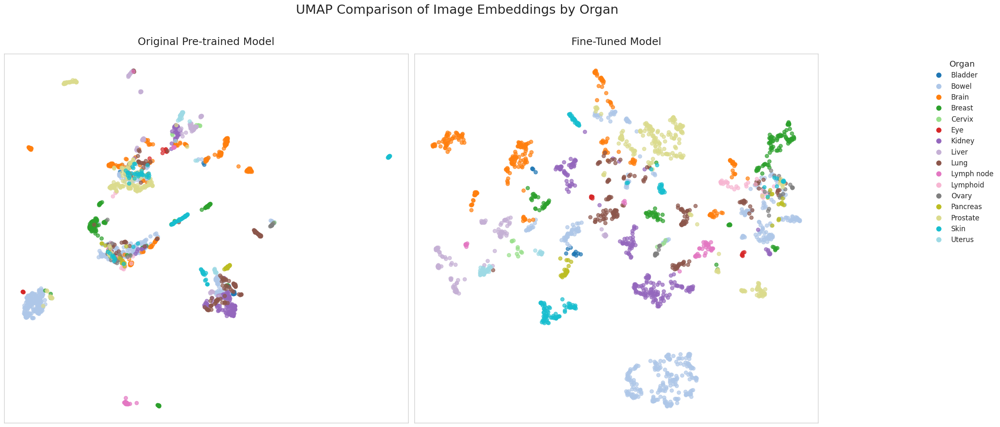

2025-06-28 00:01:07 - [INFO] - Generating COMPARATIVE UMAP plot, colored by 'disease_state'...
2025-06-28 00:01:07 - [INFO] - Calculating embeddings for the ORIGINAL model...


Calculating embeddings for CLIP:   0%|          | 0/63 [00:00<?, ?it/s]

/tmp/ipykernel_8728/1935192311.py:70: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
2025-06-28 00:01:44 - [INFO] - Calculating embeddings for the FINE-TUNED model...


Calculating embeddings for CLIP:   0%|          | 0/63 [00:00<?, ?it/s]

2025-06-28 00:02:09 - [INFO] - Running UMAP on original embeddings...
/public/home/jijh/micromamba/envs/gigapath/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
2025-06-28 00:02:16 - [INFO] - Running UMAP on fine-tuned embeddings...


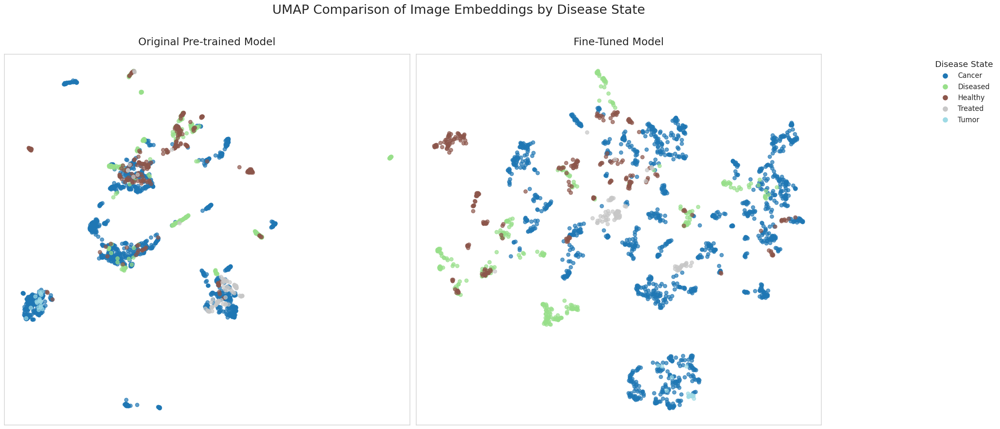

2025-06-28 00:02:24 - [INFO] - ====== Comparative Metadata-Driven UMAP Visualization Finished ======


In [41]:
# ==============================================================================
# 6. COMPARATIVE METADATA-DRIVEN UMAP VISUALIZATION: NEW CELL
# ==============================================================================
# 确保所有必要的库都已导入
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from tqdm.auto import tqdm

try:
    import umap
except ImportError:
    print("错误: The 'umap-learn' library is not installed. 请先安装 'pip install umap-learn'")
    raise

class ComparativeMetadataUMAPVisualizer:
    """
    一个专门用于对比原始模型和微调后模型的图像嵌入UMAP空间的类。
    可视化将根据生物学元数据进行着色。
    """
    def __init__(self, visualizer, meta_df: pd.DataFrame):
        """
        使用一个已初始化的 ClipVisualizer 和元数据DataFrame进行初始化。
        """
        self.config = visualizer.config
        # [修改] 同时获取原始模型和微调后模型
        self.original_model = visualizer.original_model
        self.finetuned_model = visualizer.finetuned_model
        
        self.img_processor = visualizer.img_processor
        self.device = self.config.DEVICE
        
        logging.info("Initializing ComparativeMetadataUMAPVisualizer...")
        self.df_merged = self._merge_metadata(visualizer.df_val, meta_df)

    def _merge_metadata(self, df_val: pd.DataFrame, df_meta: pd.DataFrame) -> pd.DataFrame:
        """
        通过从图像路径中提取ID，将验证清单与元数据进行合并。 (此函数无需改变)
        """
        logging.info("Merging validation manifest with biological metadata...")
        try:
            df_val['id'] = df_val['image_path'].apply(
                lambda p: os.path.basename(os.path.dirname(p)).split('_')[0]
            )
        except Exception as e:
            logging.error(f"从路径中提取ID失败: {e}")
            return df_val

        df_merged = pd.merge(df_val, df_meta, on='id', how='left')
        matched_count = df_merged['organ'].notna().sum()
        total_count = len(df_merged)
        logging.info(f"合并完成: {matched_count}/{total_count} 个验证样本成功匹配到元数据。")
        if matched_count < total_count:
            logging.warning(f"{total_count - matched_count} 个样本未能找到匹配的元数据。")
        return df_merged

    def _get_image_embeddings(self, model, image_paths: list, batch_size: int = 32) -> np.ndarray:
        """
        为给定的图像路径列表批量计算图像嵌入。(此函数无需改变, model作为参数传入)
        """
        all_embeds = []
        model.eval()
        for i in tqdm(range(0, len(image_paths), batch_size), desc=f"Calculating embeddings for {model.__class__.__name__}"):
            batch_paths = image_paths[i:i+batch_size]
            images = [self.img_processor(Image.open(p).convert("RGB")) for p in batch_paths]
            image_tensor = torch.stack(images).to(self.device)

            with torch.no_grad(), torch.cuda.amp.autocast():
                image_features = model.encode_image(image_tensor)
                image_features /= image_features.norm(dim=-1, keepdim=True)
                all_embeds.append(image_features.cpu().numpy())
        return np.vstack(all_embeds)

    def _plot_single_umap(self, ax, embeds_2d, labels, title, unique_labels, cmap):
        """
        [辅助函数] 用于在给定的ax上绘制一个UMAP图。
        """
        for i, label in enumerate(unique_labels):
            mask = np.array([l == label for l in labels])
            ax.scatter(
                embeds_2d[mask, 0],
                embeds_2d[mask, 1],
                color=cmap.colors[i % len(cmap.colors)], # 循环使用颜色
                label=label,
                alpha=0.7,
                s=40
            )
        ax.set_title(title, fontsize=18, pad=15)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(True, linestyle='--', alpha=0.6)

    def plot_comparative_umap_by_metadata(self, tag_column: str, sample_size: int = 1000, random_seed: int = 42):
        """
        [核心修改] 生成并排的UMAP对比图，按指定元数据列着色。
        """
        if tag_column not in self.df_merged.columns:
            logging.error(f"错误: 标签列 '{tag_column}' 不存在。可用列: {self.df_merged.columns.tolist()}")
            return

        logging.info(f"Generating COMPARATIVE UMAP plot, colored by '{tag_column}'...")
        
        # 1. 准备数据 (与之前相同)
        df_tagged = self.df_merged.dropna(subset=[tag_column])
        sample_size = min(sample_size, len(df_tagged))
        df_sample = df_tagged.sample(n=sample_size, random_state=random_seed)
        image_paths = df_sample['image_path'].tolist()
        labels = df_sample[tag_column].tolist()

        # 2. [修改] 为两个模型分别计算嵌入
        logging.info("Calculating embeddings for the ORIGINAL model...")
        orig_embeds = self._get_image_embeddings(self.original_model, image_paths)
        
        logging.info("Calculating embeddings for the FINE-TUNED model...")
        ft_embeds = self._get_image_embeddings(self.finetuned_model, image_paths)

        # 3. [修改] 为两组嵌入分别进行UMAP降维
        reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, metric='cosine', random_state=random_seed)
        logging.info("Running UMAP on original embeddings...")
        orig_embeds_2d = reducer.fit_transform(orig_embeds)
        
        logging.info("Running UMAP on fine-tuned embeddings...")
        ft_embeds_2d = reducer.fit_transform(ft_embeds)

        # 4. [修改] 绘制并排的对比图
        fig, axes = plt.subplots(1, 2, figsize=(22, 10))
        fig.suptitle(f"UMAP Comparison of Image Embeddings by {tag_column.replace('_', ' ').title()}", fontsize=22, y=1.02)
        
        unique_labels = sorted(df_sample[tag_column].unique())
        cmap = plt.get_cmap('tab20', len(unique_labels)) # 使用颜色丰富的'tab20'

        # 绘制左图 (原始模型)
        self._plot_single_umap(axes[0], orig_embeds_2d, labels, "Original Pre-trained Model", unique_labels, cmap)
        
        # 绘制右图 (微调后模型)
        self._plot_single_umap(axes[1], ft_embeds_2d, labels, "Fine-Tuned Model", unique_labels, cmap)

        # 创建一个统一的图例
        legend_elements = [Line2D([0], [0], marker='o', color='w', label=label,
                                  markerfacecolor=cmap.colors[i % len(cmap.colors)], markersize=10)
                           for i, label in enumerate(unique_labels)]
        fig.legend(handles=legend_elements, title=tag_column.replace('_', ' ').title(),
                   bbox_to_anchor=(1.01, 0.9), loc='upper left', fontsize='large', title_fontsize='x-large')
        
        plt.tight_layout(rect=[0, 0, 0.9, 1]) # 调整布局为图例留出空间
        plt.show()

# ==============================================================================
# 7. EXECUTION FOR COMPARATIVE METADATA UMAP
# ==============================================================================
# 假设 'visualizer' 和 'dataset.meta_df' 对象已在之前的单元格中被创建和加载
try:
    logging.info("\n\n====== Starting Comparative Metadata-Driven UMAP Visualization ======")
    
    # 1. 初始化对比可视化器
    comp_meta_visualizer = ComparativeMetadataUMAPVisualizer(visualizer, dataset.meta_df)
    
    # 2. 根据不同的生物学标签绘制对比UMAP图
    SAMPLE_SIZE_FOR_UMAP = 2000 
    
    # --- 按器官 (organ) 对比 ---
    comp_meta_visualizer.plot_comparative_umap_by_metadata(
        tag_column='organ', 
        sample_size=SAMPLE_SIZE_FOR_UMAP
    )
    
    # --- 按疾病状态 (disease_state) 对比 ---
    comp_meta_visualizer.plot_comparative_umap_by_metadata(
        tag_column='disease_state',
        sample_size=SAMPLE_SIZE_FOR_UMAP
    )

    logging.info("====== Comparative Metadata-Driven UMAP Visualization Finished ======")

except NameError as e:
    logging.error(f"执行失败: 确保 'visualizer' 和 'dataset.meta_df' 对象已在之前的单元格中成功创建。错误: {e}")
except Exception as e:
    logging.error(f"在对比UMAP可视化过程中发生未知错误: {e}", exc_info=True)